# Web Mining Project




The objective of this project is to describe and analyse a social web graph.

The dataset that we will describe and analyse contains real-world posts of the Twitter social platform posted during past crisis events (shootings, fires, tornado, earthquake, etc.).

The dataset has been released by the NIST TREC Incident Stream Initiative organizers (https://www.dcs.gla.ac.uk/~richardm/TREC_IS/2020/task.html) whose main objective is to foster research and academia to automatically process social media streams during emergency situations, categorizing information and help requests made by citizen for emergency operators.

Authors :
- Maria Bracque Vendrell - 21800103
- Théo Condette - 21803967
- Rodrigue Nasr - 22201765
- Hoai-Nam Nguyen - 21911359

## Prepare environment

First, we import all the necessary library :

In [ ]:
# Libraries

# Manage computer environment
import os
from google.colab import drive
import networkx as nx
import pandas as pd
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
import warnings
from scipy.stats import spearmanr
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 500)

Then, we define the data path and import data :

In [ ]:
drive.mount(os.getcwd()+'/drive')

# Path to access the different databases folders
# These may be modified according to your drives.
Everything    = 'drive/MyDrive/Web mining project/DATASET-20240122/database/Everything'
Nodes         = 'drive/MyDrive/Web mining project/DATASET-20240122/database/Nodes'
Relationships = 'drive/MyDrive/Web mining project/DATASET-20240122/database/Relationships'

Mounted at /content/drive


In [ ]:
# Nam
drive.mount(os.getcwd()+'/drive')

# Path to access the different databases folders
# These may be modified according to your drives.
Everything    = 'drive/MyDrive/Master TSE/Web Mining/Web mining project/DATASET-20240122/database/Everything'
Nodes         = 'drive/MyDrive/Master TSE/Web Mining/Web mining project/DATASET-20240122/database/Nodes'
Relationships = 'drive/MyDrive/Master TSE/Web Mining/Web mining project/DATASET-20240122/database/Relationships'

Mounted at /content/drive


# Preparation of the data base

We start by importing the full graph from the corresponding directory, then we create a copy with the corresponding directions.

In [ ]:
graph = nx.read_graphml(Everything + '/database_formated_for_NetworkX.graphml')
g = graph.copy()
g = nx.DiGraph(g)

Then we proceed by grouping the information that will be used for the analysis afterwards. We create a dataset for each node type:

1) `df_user`: Contains information about the user such as username, number of tweets, number of likes, and number of followers.


2) `df_event`: Stores detailed information about events, including their ID, type, and  associated topic.


3) `df_tweet`: Contains data related to tweets such as their ID, time of creation, number of retweets, like count, text, priority, and  number of replies received. It is also associated with events based on the topic ID.


4) `df_hashtag`: Records information about hashtags, including their ID and the number of occurrences.

In [ ]:
# This cell is used to create all the necessary data bases for the project

    # Nodes and edges list :

nodes_data = list(g.nodes(data=True))
edges_data = list(g.edges(data=True))



    # Creation of the dataset : a dataset for each node type (user, tweet, event, hashtag,)

# NODE (USER)
user_data = [(node[0],
              node[1]['id'],
               node[1]['statuses_count'],
               node[1]['favourites_count'],node[1]['followers_count'])
              for node in nodes_data if node[1]['labels'] == ':User']

columns = ['general_id','User_id','User_Tweet_Count', 'User_Has_liked_count','User_followers_count']
df_user = pd.DataFrame(user_data, columns=columns)
unique_user_ids = df_user['User_id'].unique()

# NODE (EVENT)
event_data = [(node[0],
               node[1]['id'],
               node[1]['eventType'],
               node[1]['trecisid'])
              for node in nodes_data if node[1]['labels'] == ':Event']

columns = ['general_id', 'Event_ID', 'Event_Type','topicid']
df_event = pd.DataFrame(event_data, columns=columns)

# NODE (TWEET)
tweet_data = [(node[0],
               node[1]['id'],
               node[1]['created_at'],
               node[1]['retweet_count'],
               node[1]['favorite_count'],
               node[1]['text'],
               node[1]['annotation_postPriority'],
               node[1]['topic'] # Used to do the link between event and tweet data base
               )
              for node in nodes_data if node[1]['labels'] == ':Tweet']
columns = ['general_id','Tweet_ID','Tweet_time_creation', 'Tweet_Retweet_Count', 'Tweet_like_count','Tweet_text','Tweet_priority','topicid']
df_tweet = pd.DataFrame(tweet_data, columns=columns)

# NODE (HASHTAG)
hashtag_data = [(node[0],
                node[1]['occurences'],
                node[1]['id'])
              for node in nodes_data if node[1]['labels'] == ':Hashtag'
                 ]
columns = ['general_id', 'Hashtag_Occurences','Hashtag_ID']
df_hashtag = pd.DataFrame(hashtag_data, columns=columns)



# Add information to Node TWEET data base (df_tweet) :

  # 1 - Tweet reply_to a tweet count

# We want the edges tweet reply to a tweet
unique_tweet_ids = df_tweet['general_id'].unique()
filtered_edges = [(source, target) for source, target, data in g.edges(data=True) if data.get('label') == 'REPLY_TO' and source in unique_tweet_ids]
filtered_df_tweet_replyto_tweetid = pd.DataFrame(filtered_edges, columns=['general_id_reply', 'general_id'])
# I get the list of tweet that reply to tweet + users, I filter to get only tweet to tweet edges.
filtered_df_tweet_replyto_tweetid = filtered_df_tweet_replyto_tweetid[filtered_df_tweet_replyto_tweetid["general_id"].isin(unique_tweet_ids)]
# I want the total number of reply to a tweet, thus I sum the number of time I observe a tweet that has been replied in the list.
filtered_df_tweet_replyto_tweetid[['Replied']] = 1
reply_df = filtered_df_tweet_replyto_tweetid.groupby('general_id').sum().sort_values('Replied',ascending=False)
# I add the information on tweet dataset.
df_tweet = pd.merge(df_tweet,reply_df,on='general_id',how='left')
df_tweet['Replied'] = df_tweet['Replied'].fillna(0)


  # 2 - Merge df_tweet and df_event since they have common key

df_tweet= pd.merge(df_tweet,df_event[['Event_ID', 'Event_Type', 'topicid']],on='topicid')




# 1. Describe the Social Network and Mine Actionable Information from it




First of all, provide a dashboard for each event type (e.g., flood, fire, etc.) based on your analysis of the structure and content of the related social sub-graphs. The dashboard should provide key information about:
- The intensity of the social activity
- The central users based on different criteria: their ability to connect users, to spread information, to gather information:
- The distributions of the tweet posts and their main topics w.r.t levels of criticality among
the “Low”, “Medium”, “High” and “Critical”.

## 1.1. Intensity of the social activity

We manage a multilayer graph, also called real graph. We have to extract relevant informations by focusing our attention on specific part of this graph.

  - The hashtags occurence : Bar plot of the top hashtag by event type (flood...).

  - Retweet count:
    - Bar plot of the top Tweet retweeted by event type.
    - Bar plot of the top tweet retweeted the most 10 minutes after its creation by event type.

  - Reply count:
    - Bar plot of the top Tweet with the most of reply by event type.
    - Bar plot of the top Tweet with the most of reply 10 minutes after its creation by event type.


  - Like count:
    - Bar plot of the top Tweet liked by event type.
    - Bar plot of the top Tweet liked 10 minutes after its creation by event type.

  - Number of tweet : Time series of the number of tweet by minute for the first 3 hours by event type.



### General

 Let's start by looking at the top 50 hashtag occurences:

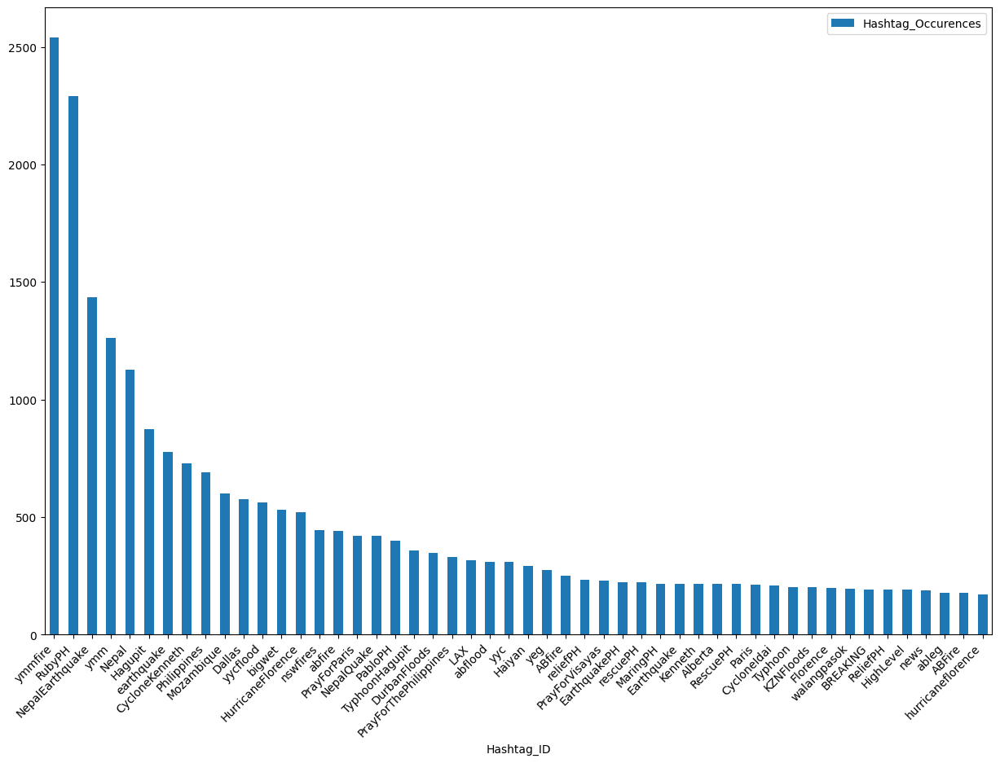

In [ ]:
# Top hashtag
df_hashtag.sort_values("Hashtag_Occurences",ascending=False)[:50].plot(x='Hashtag_ID',kind="bar",figsize=(15,10))
plt.xticks(rotation=45, ha='right')
plt.show()

We can see here that the 5 most used hashtags are:
1. ymmfire: the wildfire in northern Alberta (Canada)
2. RubyPH: Typhoon Ruby that hit the Philippines
3. NepalEarthquake: the Nepal earthquake, also known as the Gorkha earthquake
4. ymm
5. Nepal

Next, we want to plot the top tweets by retweet count for each event type. We are going to group the tweets by event type, and for each group, we will select the top 10 tweets with the highest retweet counts.

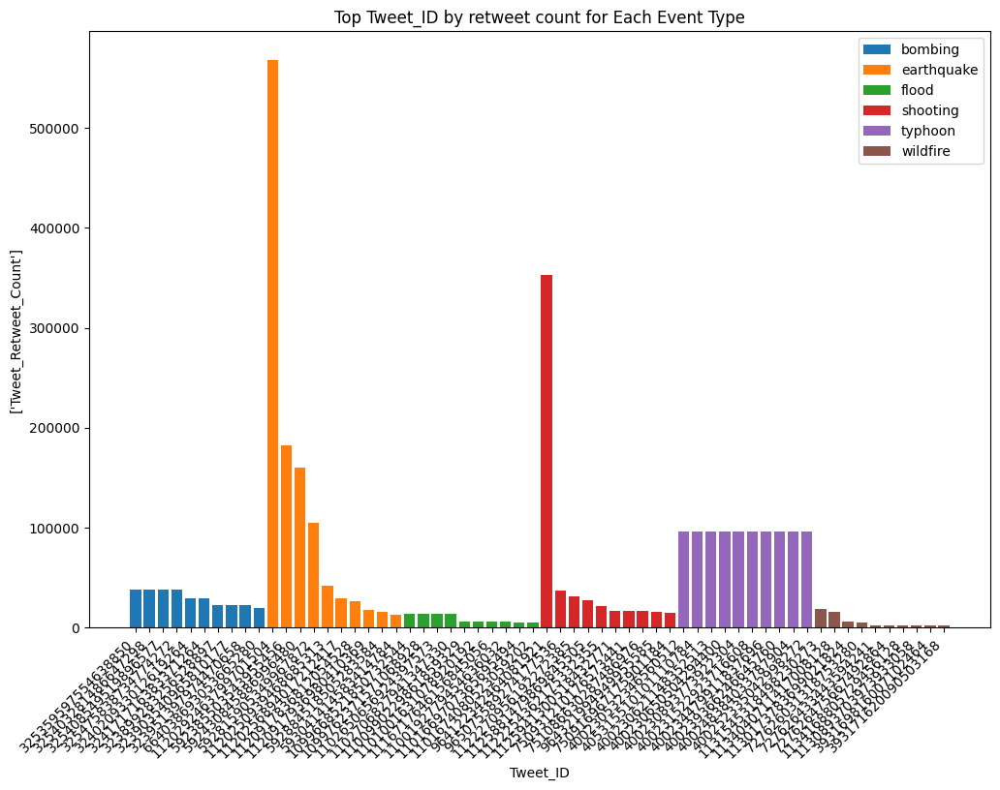

In [ ]:
grouped_df = df_tweet.groupby(['Event_Type', 'Tweet_ID'])['Tweet_Retweet_Count'].sum().reset_index()
top_hashtags = grouped_df.groupby('Event_Type').apply(lambda x: x.nlargest(10, 'Tweet_Retweet_Count')).reset_index(drop=True)
fig, ax = plt.subplots(figsize=(12, 8))
for event_type, data in top_hashtags.groupby('Event_Type'):
    ax.bar(data['Tweet_ID'], data['Tweet_Retweet_Count'], label=event_type)

ax.set_xlabel('Tweet_ID')
ax.set_ylabel(['Tweet_Retweet_Count'])
ax.set_title('Top Tweet_ID by retweet count for Each Event Type')
ax.legend()
plt.xticks(rotation=45, ha='right')
plt.show()

We can see that the type of event that has the most retweets is earthquake.

Now let's see what the number of retweets by event type one hour after the first tweet was posted.

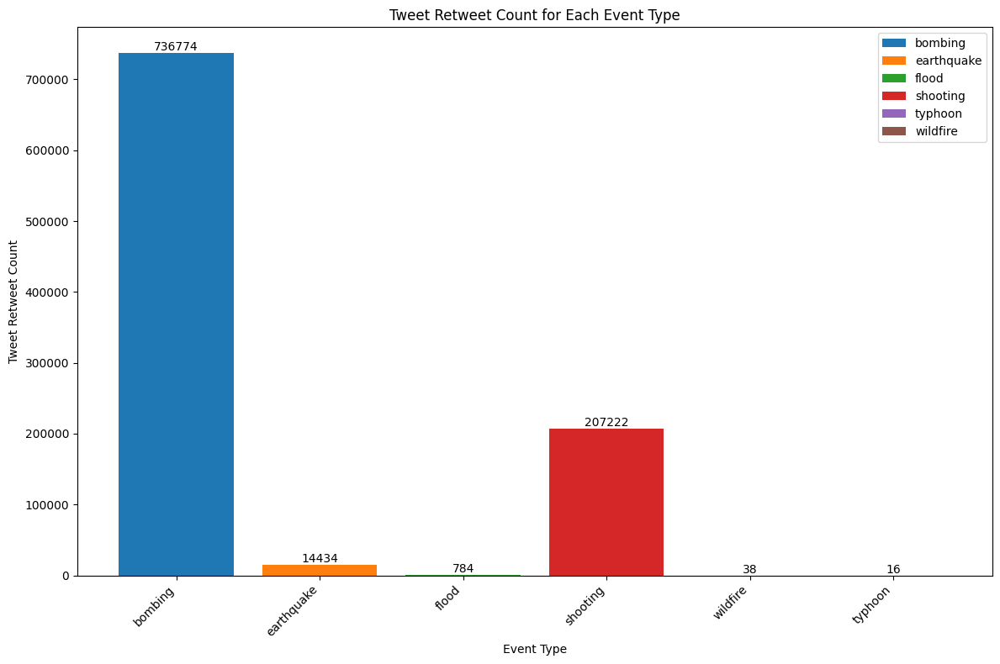

In [ ]:
tick_positions = []
counts = []

# Iterate over each event type
for event_type in ["earthquake", "earthquake", "flood", "shooting", "typhoon", "wildfire"]:
    df_tweet_with_datetime = df_tweet.copy()
    df_tweet_with_datetime["Tweet_time_creation"] = pd.to_datetime(df_tweet_with_datetime['Tweet_time_creation'], format='%Y-%m-%dT%H:%MZ')
    date_of_first = min(df_tweet_with_datetime[df_tweet_with_datetime["Event_Type"]==event_type]["Tweet_time_creation"])
    after_one_hour = df_tweet_with_datetime[(df_tweet_with_datetime["Tweet_time_creation"] >= date_of_first) & (df_tweet_with_datetime["Tweet_time_creation"] <= (date_of_first + pd.Timedelta(hours=1)))]
    grouped_df = after_one_hour.groupby(['Event_Type'])['Tweet_Retweet_Count'].sum().reset_index()
    top_hashtags = grouped_df.groupby('Event_Type').apply(lambda x: x.nlargest(10, 'Tweet_Retweet_Count')).reset_index(drop=True)

    accumulated_data = accumulated_data.append(top_hashtags, ignore_index=True)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

for i, (event_type, data) in enumerate(accumulated_data.groupby('Event_Type')):
    count = data['Tweet_Retweet_Count'].sum()
    ax.bar(i, count, label=event_type)
    tick_positions.append(i)
    counts.append(count)

ax.set_xlabel('Event Type')
ax.set_ylabel('Tweet Retweet Count')
ax.set_title('Tweet Retweet Count for Each Event Type')
plt.xticks(ticks=tick_positions, labels=accumulated_data['Event_Type'].unique(), rotation=45, ha='right')

# Add count labels on top of each bar
for i, count in enumerate(counts):
    ax.text(i, count + 10, str(count), ha='center', va='bottom')

plt.legend()
plt.tight_layout()
plt.show()


Now, let's analyze the number of tweet replies for each event type and identify the top 10 tweets with the highest reply counts for each event type.

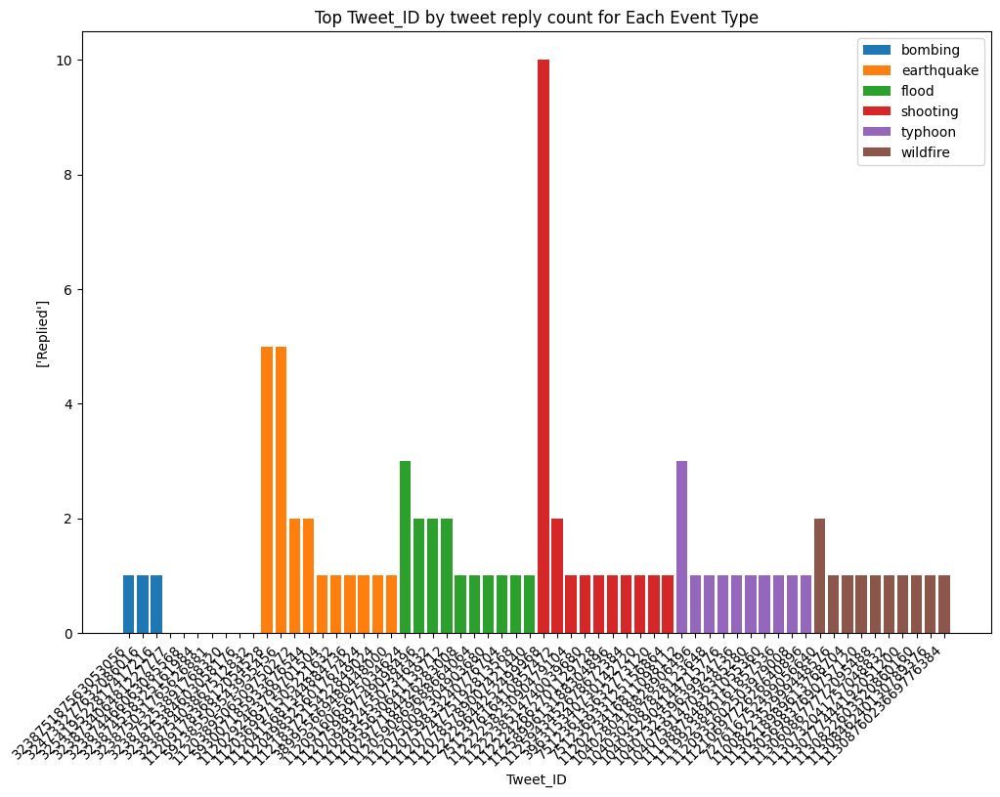

In [ ]:
grouped_df = df_tweet.groupby(['Event_Type', 'Tweet_ID'])['Replied'].sum().reset_index()
top_hashtags = grouped_df.groupby('Event_Type').apply(lambda x: x.nlargest(10, 'Replied')).reset_index(drop=True)
fig, ax = plt.subplots(figsize=(12, 8))
for event_type, data in top_hashtags.groupby('Event_Type'):
    ax.bar(data['Tweet_ID'], data['Replied'], label=event_type)

ax.set_xlabel('Tweet_ID')
ax.set_ylabel(['Replied'])
ax.set_title('Top Tweet_ID by tweet reply count for Each Event Type')
ax.legend()
plt.xticks(rotation=45, ha='right')
plt.show()

Following, let's have a look at the top tweets with the highest like counts for each event type. This will give us insights into the most popular and well-received tweets during different types of events.

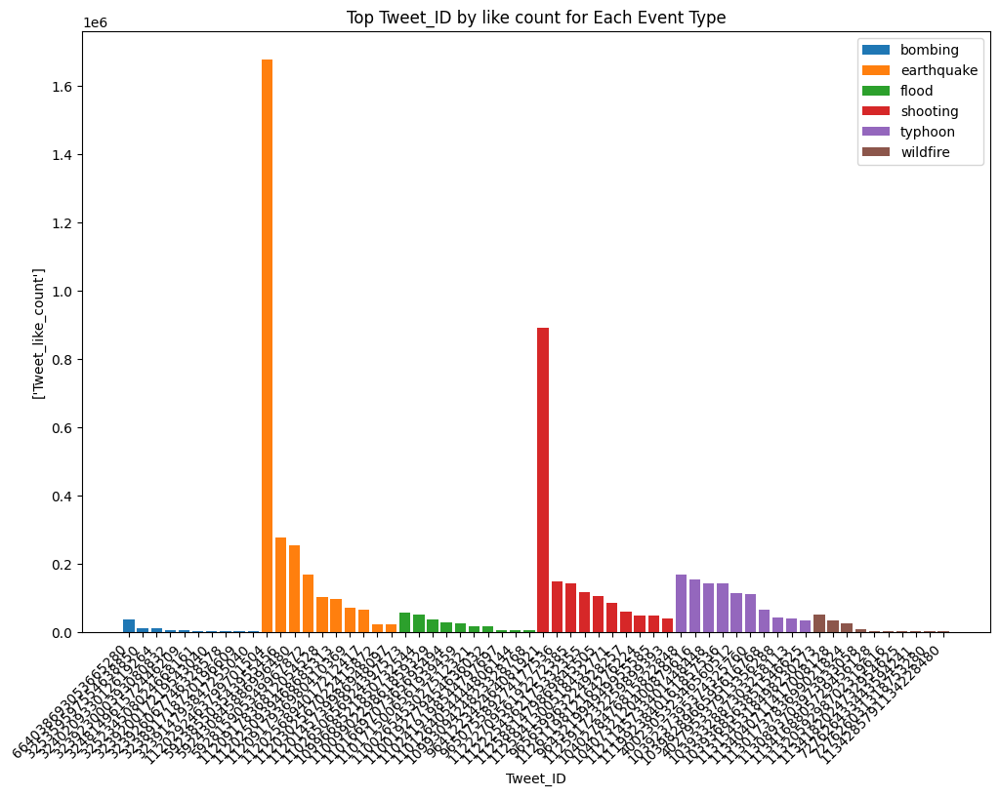

In [ ]:
grouped_df = df_tweet.groupby(['Event_Type', 'Tweet_ID'])['Tweet_like_count'].sum().reset_index()
top_hashtags = grouped_df.groupby('Event_Type').apply(lambda x: x.nlargest(10, 'Tweet_like_count')).reset_index(drop=True)
fig, ax = plt.subplots(figsize=(12, 8))
for event_type, data in top_hashtags.groupby('Event_Type'):
    ax.bar(data['Tweet_ID'], data['Tweet_like_count'], label=event_type)

ax.set_xlabel('Tweet_ID')
ax.set_ylabel(['Tweet_like_count'])
ax.set_title('Top Tweet_ID by like count for Each Event Type')
ax.legend()
plt.xticks(rotation=45, ha='right')

plt.show()

### Hashtags and Event type

Before starting this next part of the analysis, we are going to create a function that will help us to extract data related to the relationship we want to analyze. This will help us create the link between hashtags and event types.

In [ ]:
def get_edges(g, relationship, option=False):
    if option:
        edges = [(source, target, data.get(option)) for source, target, data in g.edges(data=True) if data.get('label') == relationship]
    else:
        edges = [(source, target) for source, target, data in g.edges(data=True) if data.get('label') == relationship]
    return edges

g = graph.copy()
g = nx.DiGraph(g)

# EDGES (HAS_HASHTAG): Tweet ID and Hastag ID
df_tweet_hashtag = pd.DataFrame(get_edges(g, 'HAS_HASHTAG'), columns=['general_id_tweet', 'general_id_hashtag'])

df_tweet_hashtag = df_tweet_hashtag.merge(df_hashtag, left_on = 'general_id_hashtag', right_on = 'general_id')
df_tweet_hashtag = df_tweet_hashtag.merge(df_tweet[['general_id', 'Event_Type', 'Tweet_time_creation']], left_on = 'general_id_tweet', right_on = 'general_id')

df_tweet_hashtag['Tweet_time_creation'] = pd.to_datetime(df_tweet_hashtag['Tweet_time_creation'])
df_tweet_hashtag['Date'] = df_tweet_hashtag['Tweet_time_creation'].dt.date

df_tweet_hashtag = df_tweet_hashtag[['general_id_tweet', 'general_id_hashtag',
       'Hashtag_Occurences', 'Hashtag_ID', 'Event_Type',
       'Date']]

print(df_tweet_hashtag.shape)
df_tweet_hashtag.head()

(55414, 6)


,general_id_tweet,general_id_hashtag,Hashtag_Occurences,Hashtag_ID,Event_Type,Date
0,n582,n99813,8,colorado,wildfire,2012-06-09
1,n582,n100609,3,amazing,wildfire,2012-06-09
2,n1667,n99813,8,colorado,flood,2013-09-12
3,n1667,n93,128,boulderflood,flood,2013-09-12
4,n1667,n105982,1,Preachit,flood,2013-09-12


#### Bombing

Now, let's have a look at the hastag occurences for the 'Bombing' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

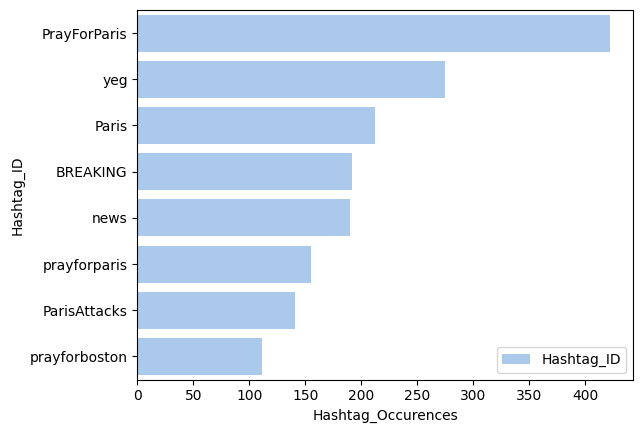

In [ ]:
# bombing
df_tweet_hashtag_bombing = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'bombing']
occurence = df_tweet_hashtag_bombing.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for bombing events is PrayForParis.

Now, let's find which hashtag was used the most within a day from the first occurrence.

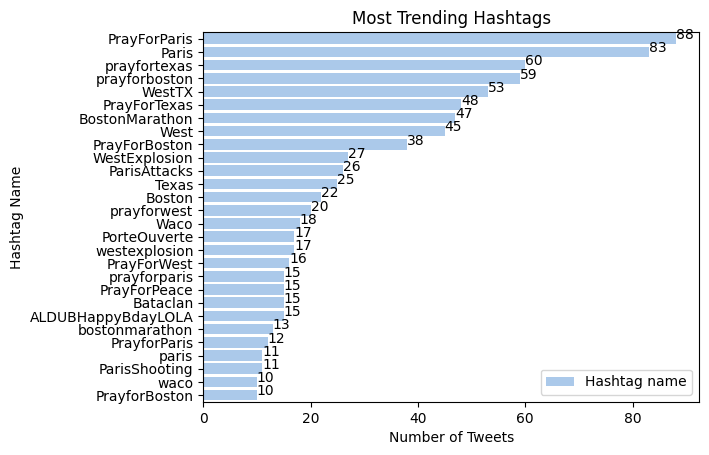

In [ ]:
first_occurence = df_tweet_hashtag_bombing.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_bombing = pd.merge(df_tweet_hashtag_bombing, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_bombing['Gap'] = df_tweet_hashtag_bombing['Date'] - df_tweet_hashtag_bombing['First_Occurence']

hashtag_trend = df_tweet_hashtag_bombing[df_tweet_hashtag_bombing['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'PrayForParis' was used 88 times!


#### Earthquake

Now, let's have a look at the hastag occurences for the 'Earthquake' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

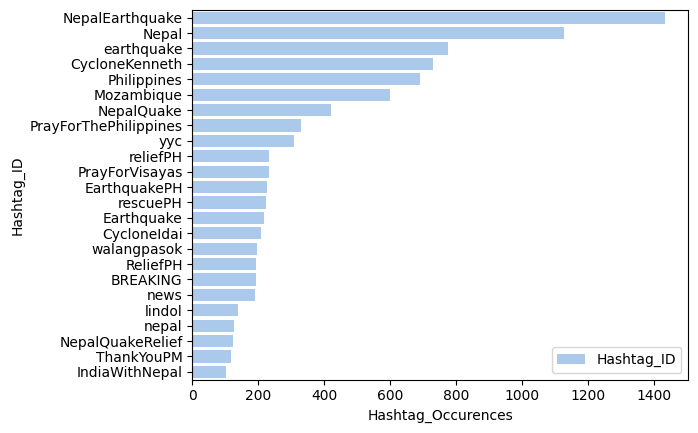

In [ ]:
# earthquake
df_tweet_hashtag_earthquake = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'earthquake']
occurence = df_tweet_hashtag_earthquake.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for earthquake events is NepalEarthquake.

Now, let's find which hashtag was used the most within a day from the first occurrence.

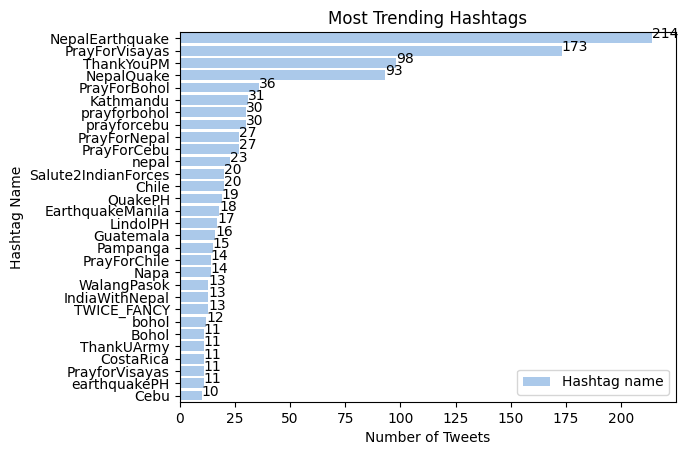

In [ ]:
first_occurence = df_tweet_hashtag_earthquake.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_earthquake = pd.merge(df_tweet_hashtag_earthquake, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_earthquake['Gap'] = df_tweet_hashtag_earthquake['Date'] - df_tweet_hashtag_earthquake['First_Occurence']

hashtag_trend = df_tweet_hashtag_earthquake[df_tweet_hashtag_earthquake['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'NepalEarthquake' was used 214 times!


#### Flood

Now, let's have a look at the hastag occurences for the 'Flood' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

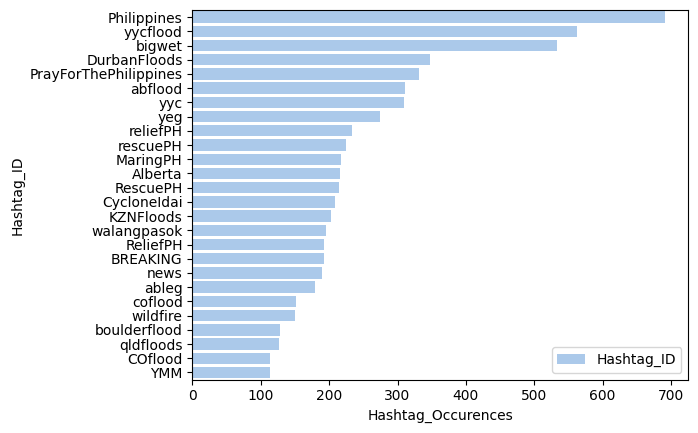

In [ ]:
# flood
df_tweet_hashtag_flood = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'flood']
occurence = df_tweet_hashtag_flood.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for flood events is Philippines.

Now, let's find which hashtag was used the most within a day from the first occurrence.

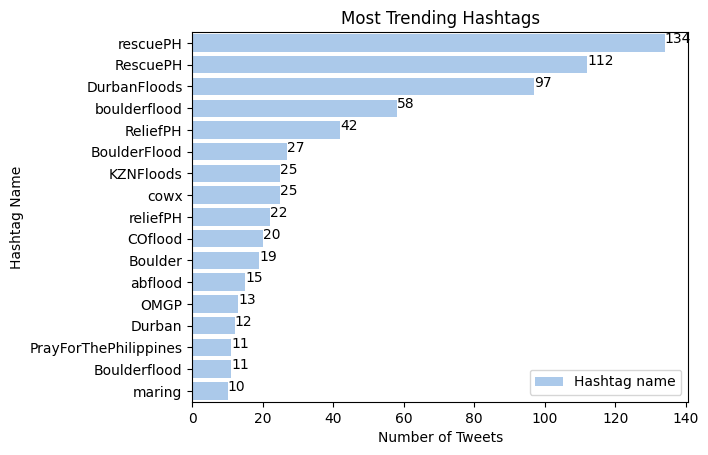

In [ ]:
first_occurence = df_tweet_hashtag_flood.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_flood = pd.merge(df_tweet_hashtag_flood, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_flood['Gap'] = df_tweet_hashtag_flood['Date'] - df_tweet_hashtag_flood['First_Occurence']

hashtag_trend = df_tweet_hashtag_flood[df_tweet_hashtag_flood['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'rescuePH' was used 134 times!


#### Shooting

Now, let's have a look at the hastag occurences for the 'Shooting' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

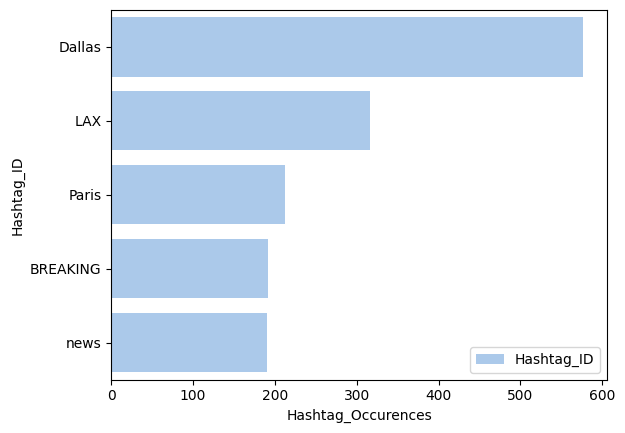

In [ ]:
# shooting
df_tweet_hashtag_shooting = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'shooting']
occurence = df_tweet_hashtag_shooting.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for shooting events is Dallas.

Now, let's find which hashtag was used the most within a day from the first occurrence.

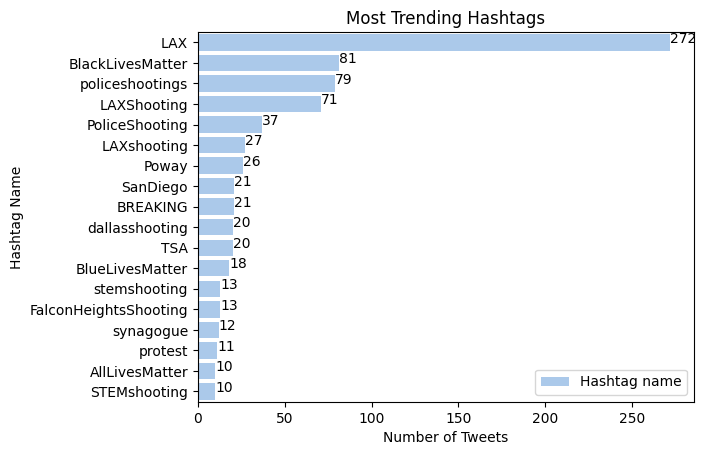

In [ ]:
first_occurence = df_tweet_hashtag_shooting.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_shooting = pd.merge(df_tweet_hashtag_shooting, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_shooting['Gap'] = df_tweet_hashtag_shooting['Date'] - df_tweet_hashtag_shooting['First_Occurence']

hashtag_trend = df_tweet_hashtag_shooting[df_tweet_hashtag_shooting['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'LAX' was used 272 times!


#### Typhoon

Now, let's have a look at the hastag occurences for the 'Typhoon' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

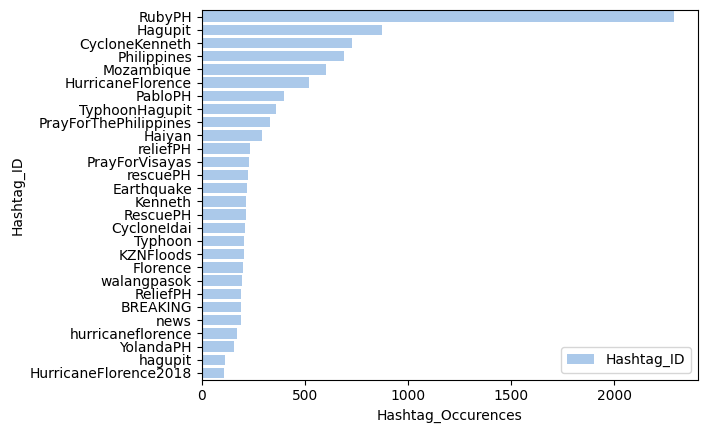

In [ ]:
# typhoon
df_tweet_hashtag_typhoon = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'typhoon']
occurence = df_tweet_hashtag_typhoon.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for typhoon events is RubyPH.

Now, let's find which hashtag was used the most within a day from the first occurrence.

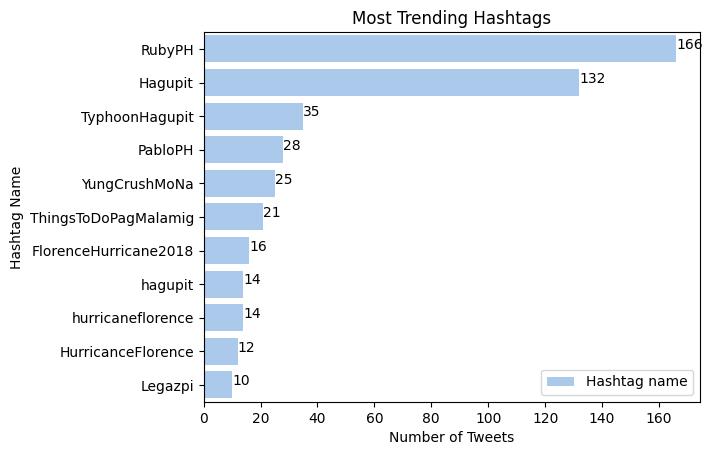

In [ ]:
first_occurence = df_tweet_hashtag_typhoon.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_typhoon = pd.merge(df_tweet_hashtag_typhoon, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_typhoon['Gap'] = df_tweet_hashtag_typhoon['Date'] - df_tweet_hashtag_typhoon['First_Occurence']

hashtag_trend = df_tweet_hashtag_typhoon[df_tweet_hashtag_typhoon['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'RubyPH' was used 166 times!


#### Wildfire

Now, let's have a look at the hastag occurences for the 'Wildfire' event type:

<Axes: xlabel='Hashtag_Occurences', ylabel='Hashtag_ID'>

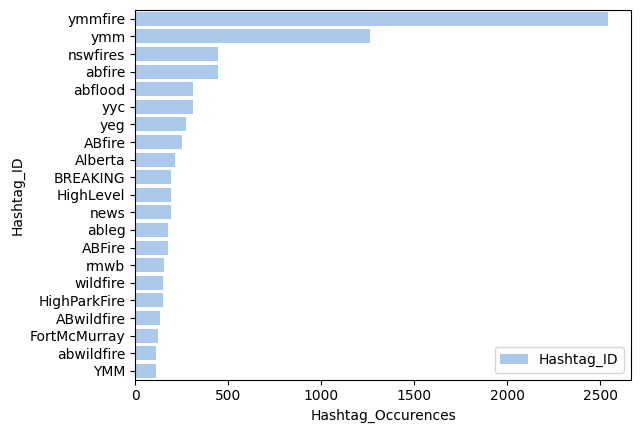

In [ ]:
# Wildfire
df_tweet_hashtag_wildfire = df_tweet_hashtag[df_tweet_hashtag['Event_Type'] == 'wildfire']
occurence = df_tweet_hashtag_wildfire.groupby(['general_id_hashtag', 'Hashtag_ID'])['Hashtag_Occurences'].mean().reset_index()

# Plot
most_popular_hashtag = occurence[occurence['Hashtag_Occurences'] >= 100].sort_values(by = 'Hashtag_Occurences', ascending = False)
sns.set_color_codes("pastel")
sns.barplot(x="Hashtag_Occurences", y="Hashtag_ID", data = most_popular_hashtag,
            label="Hashtag_ID", color="b")

We can see that the top hashtag for wild fire events is ymmfire.

Now, let's find which hashtag was used the most within a day from the first occurrence.

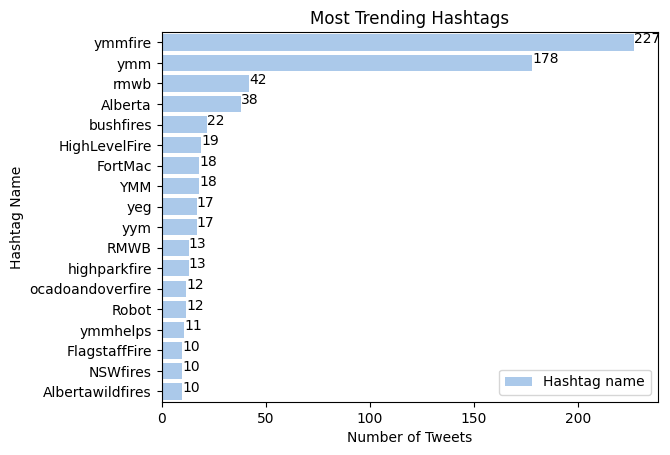

In [ ]:
first_occurence = df_tweet_hashtag_wildfire.groupby('general_id_hashtag')['Date'].min().reset_index()
first_occurence = first_occurence.rename(columns={'Date': 'First_Occurence'})
df_tweet_hashtag_wildfire = pd.merge(df_tweet_hashtag_wildfire, first_occurence, on = 'general_id_hashtag', how = 'left')

df_tweet_hashtag_wildfire['Gap'] = df_tweet_hashtag_wildfire['Date'] - df_tweet_hashtag_wildfire['First_Occurence']

hashtag_trend = df_tweet_hashtag_wildfire[df_tweet_hashtag_wildfire['Gap'] == '0 days'].groupby(['Hashtag_ID', 'general_id_hashtag'])['general_id_tweet'].count().reset_index()
hashtag_trend = hashtag_trend.sort_values(by ='general_id_tweet', ascending = False)
hashtag_most_trend = hashtag_trend[hashtag_trend['general_id_tweet'] >= 10]
sns.set_color_codes("pastel")
sns.barplot(x="general_id_tweet", y="Hashtag_ID", data = hashtag_most_trend,
            label="Hashtag name", color="b")
for index, value in enumerate(hashtag_most_trend["general_id_tweet"]):
    plt.text(value, index, str(value))
plt.xlabel("Number of Tweets")
plt.ylabel("Hashtag Name")
plt.title("Most Trending Hashtags")
plt.show()


We can see that within a day, the hashtag 'ymmfire' was used 227 times!



### Likes versus Retweets

Another interesting thing to see is the relationship between the number of retweets and the number of likes for tweets.

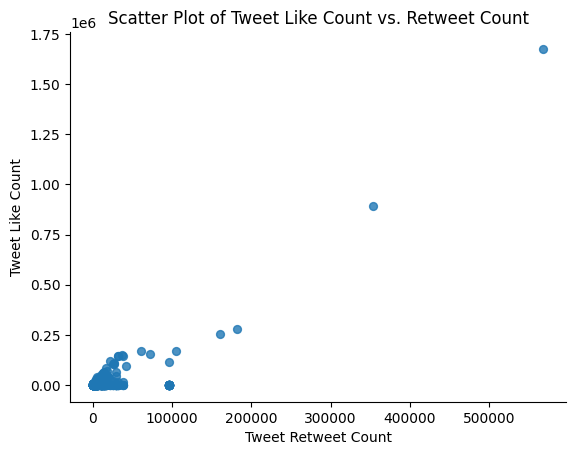

In [ ]:
df_tweet.plot(kind='scatter', x='Tweet_Retweet_Count', y='Tweet_like_count', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

plt.xlabel('Tweet Retweet Count')
plt.ylabel('Tweet Like Count')
plt.title('Scatter Plot of Tweet Like Count vs. Retweet Count')

plt.show()

Let's zoom to see the points with less than 200000 retweets:

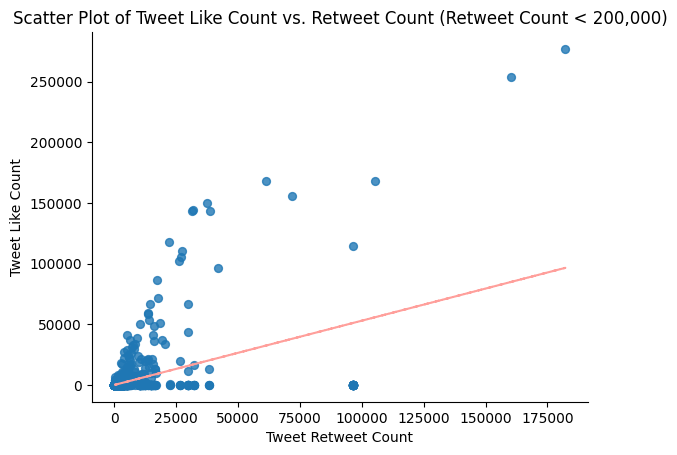

In [ ]:
filtered_df_tweet = df_tweet[df_tweet['Tweet_Retweet_Count'] < 200000]

filtered_df_tweet.plot(kind='scatter', x='Tweet_Retweet_Count', y='Tweet_like_count', s=32, alpha=.8)
plt.gca().spines[['top', 'right']].set_visible(False)

plt.xlabel('Tweet Retweet Count')
plt.ylabel('Tweet Like Count')
plt.title('Scatter Plot of Tweet Like Count vs. Retweet Count (Retweet Count < 200,000)')

# Calculate trend line
x = filtered_df_tweet['Tweet_Retweet_Count']
y = filtered_df_tweet['Tweet_like_count']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x),"r--")

plt.show()

By looking at the plot and the trend line, it looks like tweets tend to have more retweets than likes.

## 1.2. Central users

Central users: Nodes = Users, Edges = SUM(times of retweets + times of reply_to + times of mentions)
- Their ability to connect users: Connectivity = Degree Centrality (number of connections each user has)
- Their ability to spread information: Betweeness centrality (identify users who act as bridges between different parts of the network)
- Their ability to gather information: Eigenvector centrality (assess the influence of a user based on their connections and the connections of their connections. Users with high eigenvector centrality are connected to other influential users, making them potentially important gatherers of information.)
=> visualization by colors and by size of nodes as TP2 Graph Analysis

In [ ]:
def get_edges(g, relationship, option=False):
    if option:
        edges = [(source, target, data.get(option)) for source, target, data in g.edges(data=True) if data.get('label') == relationship]
    else:
        edges = [(source, target) for source, target, data in g.edges(data=True) if data.get('label') == relationship]
    return edges

# # EDGE (RETWEETS): User ID and Retweets User ID
df_retweets = pd.DataFrame(get_edges(g, 'RETWEETS', 'times'),
                           columns=['User_ID', 'Retweets_User_ID', 'Retweets_Times'])

# # EDGE (REPLIED_TO): User ID and Replied_to User ID
df_replied_to = pd.DataFrame(get_edges(g, 'REPLIED_TO', 'times'),
                             columns=['User_ID', 'Replied_to_User_ID', 'Replied_to_Times'])

# # EDGE (MENTIONS): User ID and Mentions User ID
df_mentions = pd.DataFrame(get_edges(g, 'MENTIONS', 'times'),
                           columns=['User_ID', 'Mentions_User_ID', 'Mentions_Times'])

# # EDGE (TALKS_ABOUT): User ID and Event
df_talks_about = pd.DataFrame(get_edges(g, 'TALKS_ABOUT'),
                              columns=['User_ID', 'Event_ID'])

# # NODE (USER)
user_data = [(node[0],
               node[1]['statuses_count'],
               node[1]['favourites_count'],node[1]['followers_count'])
              for node in nodes_data if node[1]['labels'] == ':User']

columns = ['User_ID','User_Tweet_Count', 'User_Has_liked_count','User_followers_count']
df_user = pd.DataFrame(user_data, columns=columns)
unique_user_ids = df_user['User_ID'].unique()

# # NODES (EVENT)
event_data = [(node[0],
               node[1]['id'],
               node[1]['eventType'],
               node[1]['trecisid'])
              for node in nodes_data if node[1]['labels'] == ':Event']

df_event = pd.DataFrame(event_data, columns = ['Event_ID', 'Event_Name', 'Event_Type','topicid'])

Let's merge the data frames related to central users by their user ID:

In [ ]:
df_central_user = pd.merge(df_user['User_ID'], df_retweets, on = 'User_ID', how = 'left')
df_central_user = pd.merge(df_central_user, df_replied_to, on = 'User_ID', how = 'left')
df_central_user = pd.merge(df_central_user, df_mentions, on = 'User_ID', how = 'left')
df_central_user = pd.merge(df_central_user, df_talks_about, on = 'User_ID', how = 'left')
df_central_user = pd.merge(df_central_user, df_event, on = 'Event_ID', how = 'left')
print(df_central_user.shape)
df_central_user.head()


(45689, 11)


,User_ID,Retweets_User_ID,Retweets_Times,Replied_to_User_ID,Replied_to_Times,Mentions_User_ID,Mentions_Times,Event_ID,Event_Name,Event_Type,topicid
0,n56568,NaN,NaN,NaN,NaN,NaN,NaN,n0,fireColorado2012,wildfire,TRECIS-CTIT-H-001
1,n56569,n97153,1.0,NaN,NaN,NaN,NaN,n0,fireColorado2012,wildfire,TRECIS-CTIT-H-001
2,n56570,NaN,NaN,NaN,NaN,NaN,NaN,n0,fireColorado2012,wildfire,TRECIS-CTIT-H-001
3,n56571,NaN,NaN,NaN,NaN,NaN,NaN,n0,fireColorado2012,wildfire,TRECIS-CTIT-H-001
4,n56571,NaN,NaN,NaN,NaN,NaN,NaN,n2,floodColorado2013,flood,TRECIS-CTIT-H-003


### Bombing

Now let's only get the central users involved in interactions related to bombing events.

In [ ]:
central_user_bombing = df_central_user[df_central_user['Event_Type'] == 'bombing']
central_user_bombing = central_user_bombing.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_bombing['Total_times'] = central_user_bombing[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_bombing['User_ID_Targeting'] = central_user_bombing[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_bombing = central_user_bombing.drop_duplicates()
central_user_bombing = central_user_bombing[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_bombing = central_user_bombing[central_user_bombing['User_ID'] != central_user_bombing['User_ID_Targeting']]
print(central_user_bombing.shape)
central_user_bombing.head()

(888, 3)


,User_ID,User_ID_Targeting,Total_times
10,n56574,n79100,1.0
1057,n57517,n90100,2.0
1223,n57662,n58997,1.0
1412,n57822,n99182,1.0
2679,n58963,n92453,1.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_bombing.

In [ ]:
g_central_user_bombing = nx.from_pandas_edgelist(central_user_bombing, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_bombing))
g_central_user_bombing.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_bombing.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n64463: Degree Centrality 35.0
Node n88246: Degree Centrality 19.0
Node n83848: Degree Centrality 13.0
Node n62177: Degree Centrality 11.0
Node n59020: Degree Centrality 10.0


The output indicates that node 'n64463' has the highest degree centrality score

These nodes represent users who are particularly active or influential in engaging with other users within the network, based on the total number of interactions they have initiated or received.

In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n64463'

Now, let's create two functions to enable the graph to retain information about a specified user and their connections within the network in order to plot a graph that will highlight nodes and edges associated with this user.

In [ ]:
def find_central_user(g, user):
    g_central_user = {node: user if node == user else '' for node in g.nodes()}
    nx.set_node_attributes(g, g_central_user, name='central_user')
    return g

def add_edge_att(g, user):
    g_connect = {(source, target): 1 if (source == user) | (target == user) else 0 for source, target in g.edges()}
    nx.set_edge_attributes(g, g_connect, name='connect')
    return g


In [ ]:
g_degree_bombing = find_central_user(g_central_user_bombing, central_node)
g_degree_bombing = add_edge_att(g_central_user_bombing, central_node)

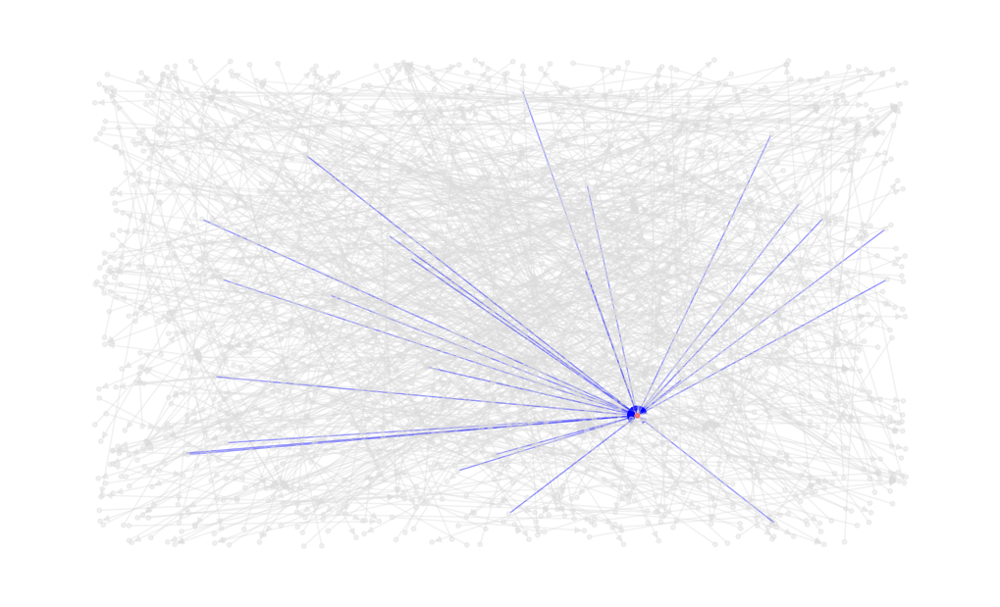

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_bombing.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_bombing.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_bombing.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_bombing.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_bombing,
        pos=nx.random_layout(g_degree_bombing),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_bombing, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n56574: Betweeness Centrality 0.0
Node n79100: Betweeness Centrality 0.0
Node n57517: Betweeness Centrality 0.0
Node n90100: Betweeness Centrality 0.0
Node n57662: Betweeness Centrality 0.0


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n56574'

Here we see that all nodes have a betweeness centrality equal to zero.

In [ ]:
g_btwn_bombing = find_central_user(g_central_user_bombing, central_btwn_node)
g_btwn_bombing = add_edge_att(g_central_user_bombing, central_btwn_node)

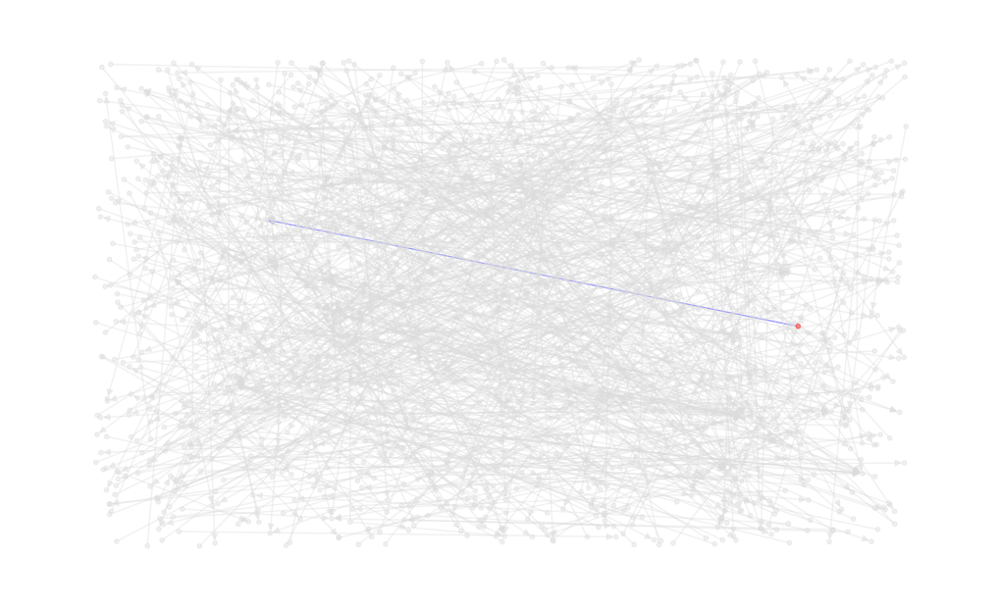

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_bombing.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_bombing.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_bombing.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_bombing.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_bombing,
        pos=nx.random_layout(g_btwn_bombing),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_bombing,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n64463'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n64463: Page Rank 0.008733993232669688
Node n88246: Page Rank 0.006752453830698294
Node n83848: Page Rank 0.004708991322415299
Node n59020: Page Rank 0.003780144727741211
Node n59398: Page Rank 0.00378014472774121


The only node that is in the top 5 of the three centrality measures is Node n64463.

In [ ]:
g_pr_bombing = find_central_user(g_central_user_bombing, central_pr_node)
g_pr_bombing = add_edge_att(g_central_user_bombing, central_pr_node)

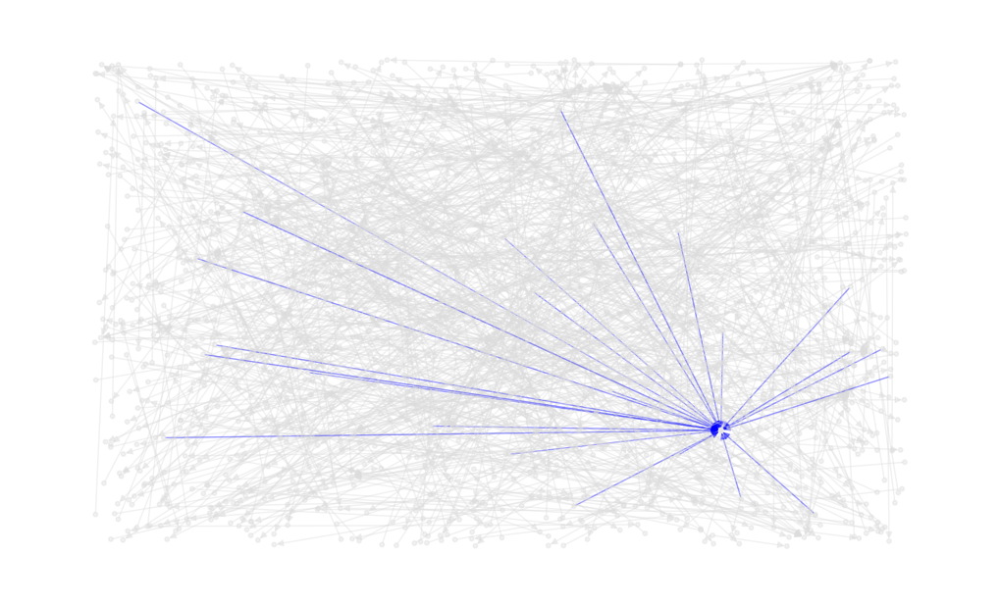

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_bombing.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_bombing.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_bombing.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_bombing.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_bombing,
        pos=nx.random_layout(g_pr_bombing),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

### Earthquake

Now let's only get the central users involved in interactions related to earthquake events.

In [ ]:
central_user_earthquake = df_central_user[df_central_user['Event_Type'] == 'earthquake']
central_user_earthquake = central_user_earthquake.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_earthquake['Total_times'] = central_user_earthquake[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_earthquake['User_ID_Targeting'] = central_user_earthquake[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_earthquake = central_user_earthquake.drop_duplicates()
central_user_earthquake = central_user_earthquake[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_earthquake = central_user_earthquake[central_user_earthquake['User_ID'] != central_user_earthquake['User_ID_Targeting']]
print(central_user_earthquake.shape)
central_user_earthquake.head()

(1373, 3)


,User_ID,User_ID_Targeting,Total_times
8,n56574,n79100,1.0
9,n56574,n79100,1.0
15,n56578,n64494,1.0
58,n56610,n79100,2.0
131,n56677,n56638,1.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_earthquake.

In [ ]:
g_central_user_earthquake = nx.from_pandas_edgelist(central_user_earthquake, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_earthquake))
g_central_user_earthquake.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_earthquake.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n96126: Degree Centrality 72.0
Node n79100: Degree Centrality 44.0
Node n90039: Degree Centrality 38.0
Node n64463: Degree Centrality 36.0
Node n58597: Degree Centrality 27.0


The output indicates that node 'n96126' has the highest degree centrality score

These nodes represent users who are particularly active or influential in engaging with other users within the network, based on the total number of interactions they have initiated or received.

In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n96126'

In [ ]:
g_degree_earthquake = find_central_user(g_central_user_earthquake, central_node)
g_degree_earthquake = add_edge_att(g_central_user_earthquake, central_node)

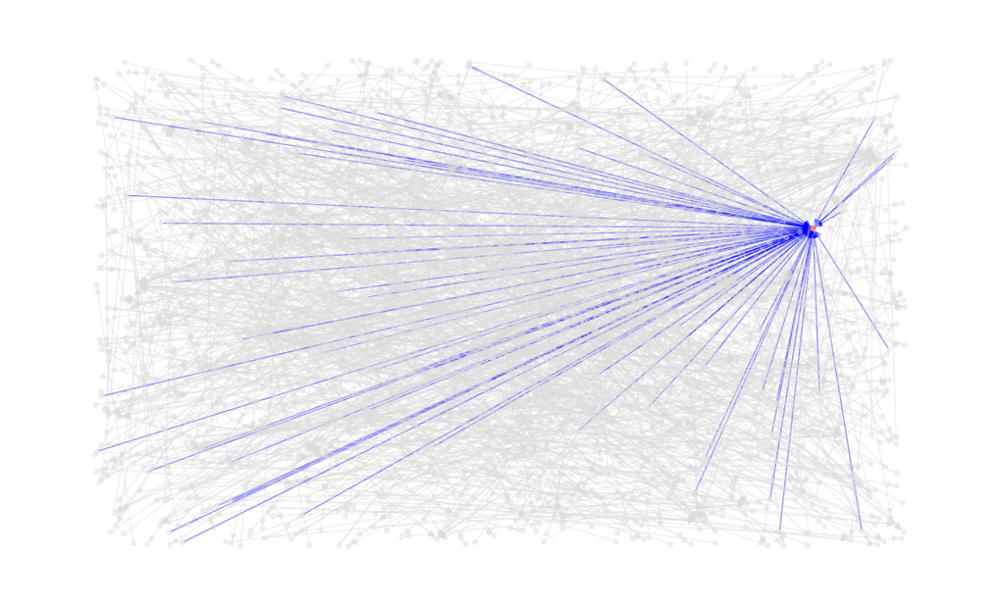

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_earthquake.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_earthquake.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_earthquake.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_earthquake.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_earthquake,
        pos=nx.random_layout(g_degree_earthquake),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_earthquake, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n58338: Betweeness Centrality 2.2255414583400896e-06
Node n89743: Betweeness Centrality 1.907606964291505e-06
Node n63853: Betweeness Centrality 1.589672470242921e-06
Node n65721: Betweeness Centrality 1.2717379761943368e-06
Node n58484: Betweeness Centrality 9.538034821457526e-07


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n58338'

Here we see that node n58338 has the highest betweenness centrality score.

In [ ]:
g_btwn_earthquake = find_central_user(g_central_user_earthquake, central_btwn_node)
g_btwn_earthquake = add_edge_att(g_central_user_earthquake, central_btwn_node)

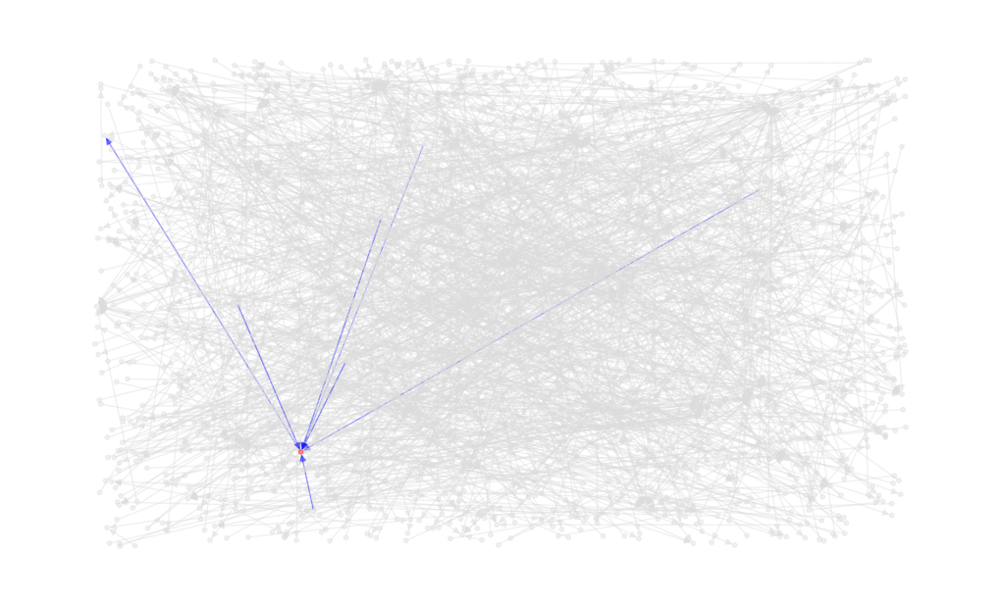

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_earthquake.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_earthquake.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_earthquake.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_earthquake.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_earthquake,
        pos=nx.random_layout(g_btwn_earthquake),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_earthquake,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n96126'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n96126: Page Rank 0.015784763142546607
Node n90039: Page Rank 0.010794855262229869
Node n79100: Page Rank 0.009811433390553697
Node n64463: Page Rank 0.0077011445973031774
Node n97054: Page Rank 0.006407280757828483


In [ ]:
g_pr_earthquake = find_central_user(g_central_user_earthquake, central_pr_node)
g_pr_earthquake = add_edge_att(g_central_user_earthquake, central_pr_node)

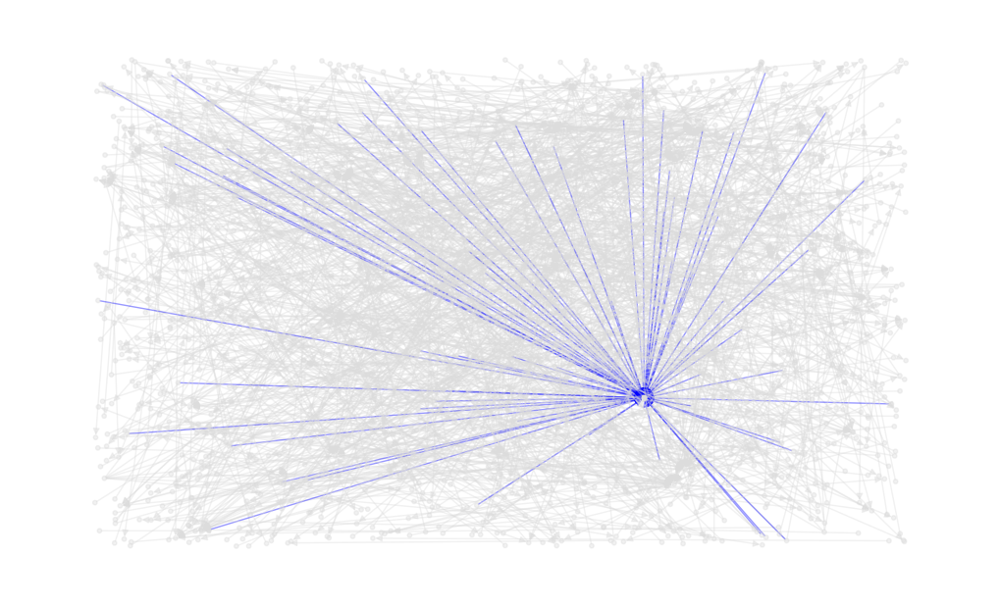

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_earthquake.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_earthquake.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_earthquake.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_earthquake.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_earthquake,
        pos=nx.random_layout(g_pr_earthquake),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

### Flood

Now let's only get the central users involved in interactions related to flood events.

In [ ]:
central_user_flood = df_central_user[df_central_user['Event_Type'] == 'flood']
central_user_flood = central_user_flood.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_flood['Total_times'] = central_user_flood[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_flood['User_ID_Targeting'] = central_user_flood[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_flood = central_user_flood.drop_duplicates()
central_user_flood = central_user_flood[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_flood = central_user_flood[central_user_flood['User_ID'] != central_user_flood['User_ID_Targeting']]
print(central_user_flood.shape)
central_user_flood.head()

(1768, 3)


,User_ID,User_ID_Targeting,Total_times
28,n56586,n97423,1.0
204,n56724,n64463,1.0
282,n56791,n97191,1.0
284,n56791,n57775,1.0
465,n56965,n97238,1.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_flood.

In [ ]:
g_central_user_flood = nx.from_pandas_edgelist(central_user_flood, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_flood))
g_central_user_flood.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_flood.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n94255: Degree Centrality 38.0
Node n63257: Degree Centrality 32.0
Node n58501: Degree Centrality 28.0
Node n98043: Degree Centrality 26.0
Node n60832: Degree Centrality 24.0


In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n94255'

In [ ]:
g_degree_flood = find_central_user(g_central_user_flood, central_node)
g_degree_flood = add_edge_att(g_central_user_flood, central_node)

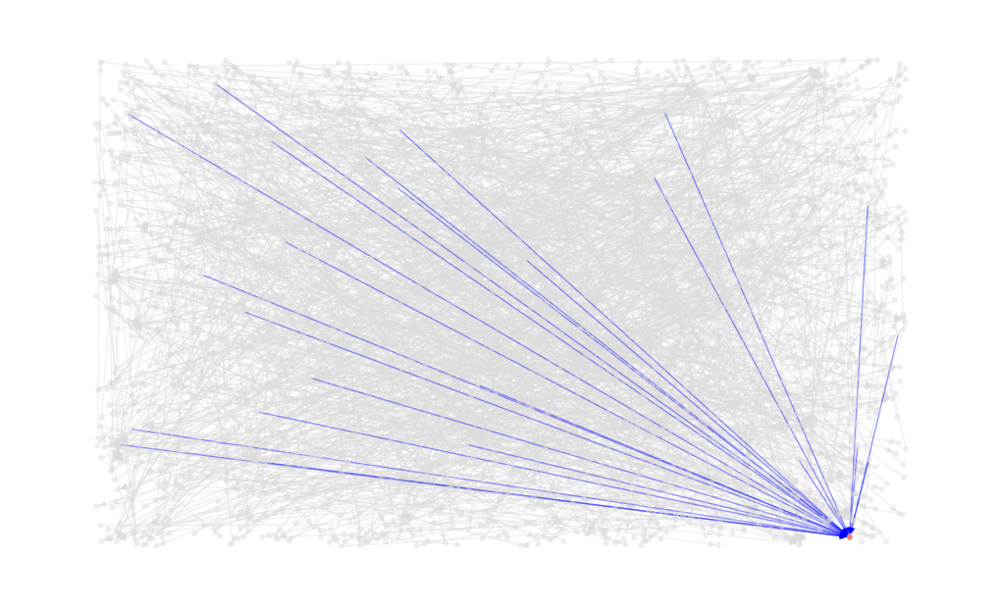

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_flood.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_flood.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_flood.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_flood.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_flood,
        pos=nx.random_layout(g_degree_flood),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_flood, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n63257: Betweeness Centrality 1.0354390978617388e-05
Node n63255: Betweeness Centrality 8.602109428389828e-06
Node n63434: Betweeness Centrality 7.64631949190207e-06
Node n63271: Betweeness Centrality 5.734739618926552e-06
Node n60729: Betweeness Centrality 3.823159745951035e-06


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n63257'

In [ ]:
g_btwn_flood = find_central_user(g_central_user_flood, central_btwn_node)
g_btwn_flood = add_edge_att(g_central_user_flood, central_btwn_node)

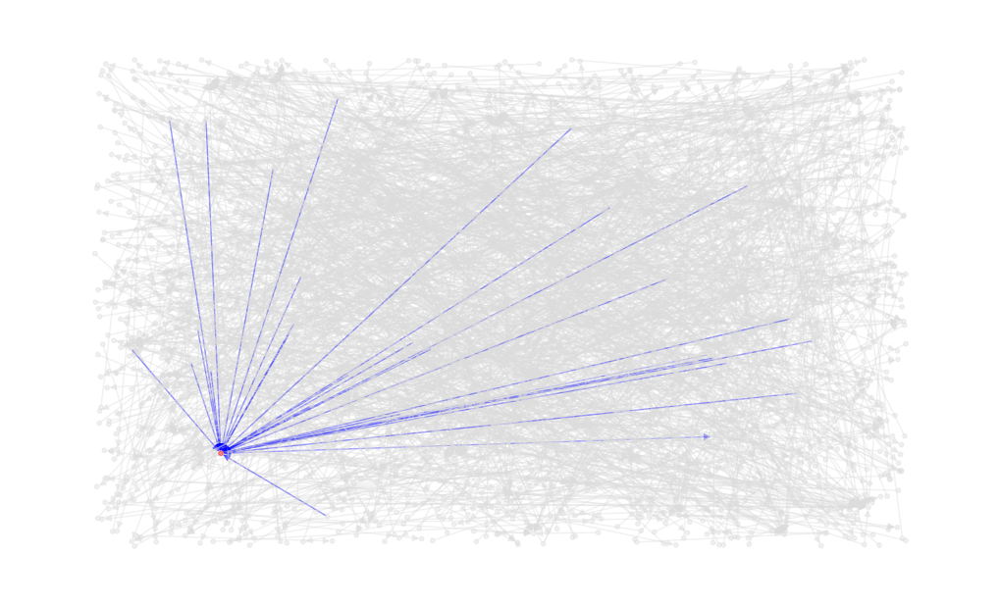

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_flood.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_flood.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_flood.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_flood.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_flood,
        pos=nx.random_layout(g_btwn_flood),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_flood,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n63257'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n63257: Page Rank 0.010641326353266064
Node n63192: Page Rank 0.009549049201115895
Node n94255: Page Rank 0.005781559150430704
Node n58501: Page Rank 0.005009584942099917
Node n98043: Page Rank 0.004730528203350221


In [ ]:
g_pr_flood = find_central_user(g_central_user_flood, central_pr_node)
g_pr_flood = add_edge_att(g_central_user_flood, central_pr_node)

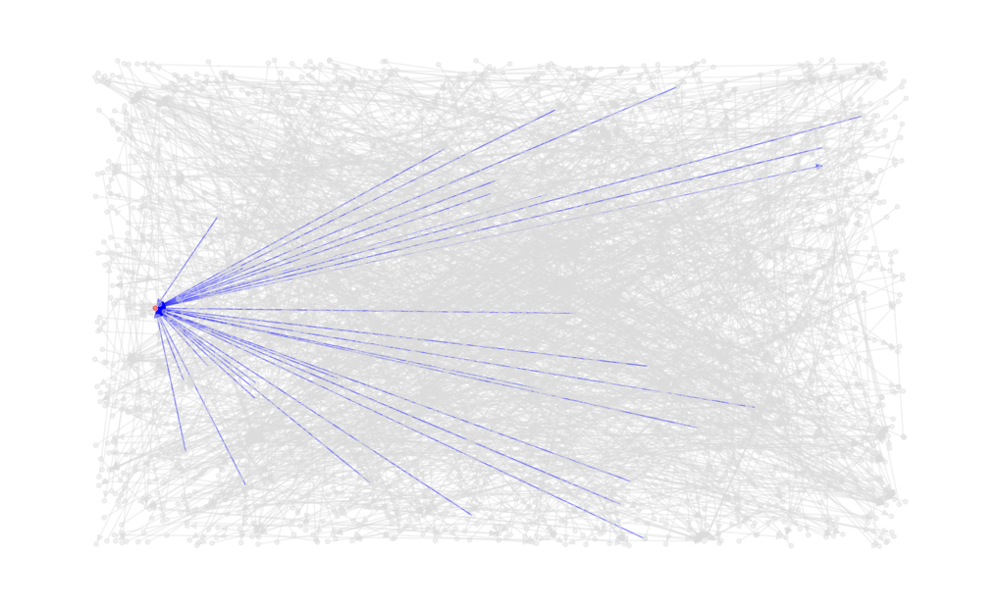

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_flood.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_flood.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_flood.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_flood.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_flood,
        pos=nx.random_layout(g_pr_flood),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

### Shooting

Now let's only get the central users involved in interactions related to shooting events.

In [ ]:
central_user_shooting = df_central_user[df_central_user['Event_Type'] == 'shooting']
central_user_shooting = central_user_shooting.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_shooting['Total_times'] = central_user_shooting[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_shooting['User_ID_Targeting'] = central_user_shooting[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_shooting = central_user_shooting.drop_duplicates()
central_user_shooting = central_user_shooting[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_shooting = central_user_shooting[central_user_shooting['User_ID'] != central_user_shooting['User_ID_Targeting']]
print(central_user_shooting.shape)
central_user_shooting.head()

(1308, 3)


,User_ID,User_ID_Targeting,Total_times
29,n56586,n97423,1.0
1222,n57662,n58997,1.0
1408,n57818,n97387,1.0
1778,n58172,n64463,1.0
1988,n58338,n97481,2.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_shooting.

In [ ]:
g_central_user_shooting = nx.from_pandas_edgelist(central_user_shooting, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_shooting))
g_central_user_shooting.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_shooting.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n96724: Degree Centrality 71.0
Node n83848: Degree Centrality 52.0
Node n57692: Degree Centrality 38.0
Node n82913: Degree Centrality 30.0
Node n64463: Degree Centrality 19.0


In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n96724'

In [ ]:
g_degree_shooting = find_central_user(g_central_user_shooting, central_node)
g_degree_shooting = add_edge_att(g_central_user_shooting, central_node)

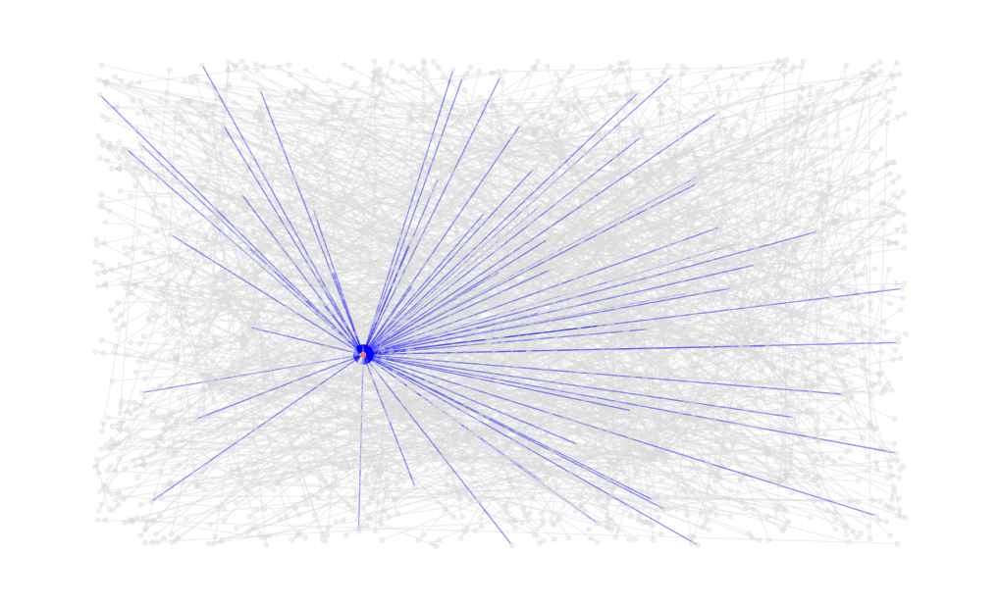

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_shooting.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_shooting.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_shooting.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_shooting.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_shooting,
        pos=nx.random_layout(g_degree_shooting),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_shooting, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n83848: Betweeness Centrality 3.415235444743079e-05
Node n95135: Betweeness Centrality 7.942408011030416e-06
Node n82914: Betweeness Centrality 2.117975469608111e-06
Node n59890: Betweeness Centrality 1.5884816022060832e-06
Node n82944: Betweeness Centrality 1.5884816022060832e-06


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n83848'

In [ ]:
g_btwn_shooting = find_central_user(g_central_user_shooting, central_btwn_node)
g_btwn_shooting = add_edge_att(g_central_user_shooting, central_btwn_node)

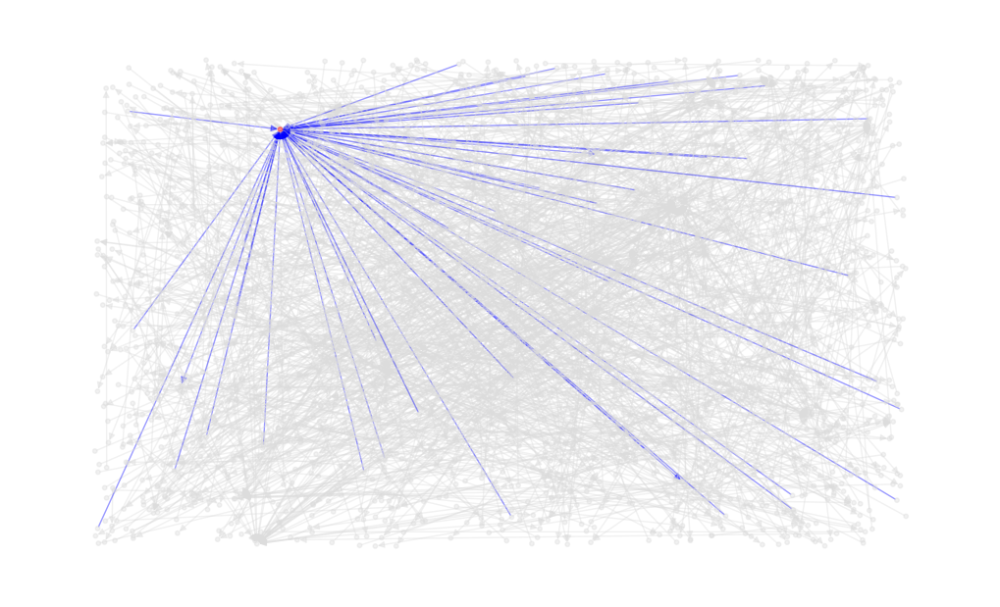

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_shooting.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_shooting.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_shooting.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_shooting.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_shooting,
        pos=nx.random_layout(g_btwn_shooting),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_shooting,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n96724'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n96724: Page Rank 0.017211533861523867
Node n83848: Page Rank 0.010386195377390772
Node n57692: Page Rank 0.008100661566448522
Node n64465: Page Rank 0.006229698272623186
Node n82913: Page Rank 0.005938419717281504


In [ ]:
g_pr_shooting = find_central_user(g_central_user_shooting, central_pr_node)
g_pr_shooting = add_edge_att(g_central_user_shooting, central_pr_node)

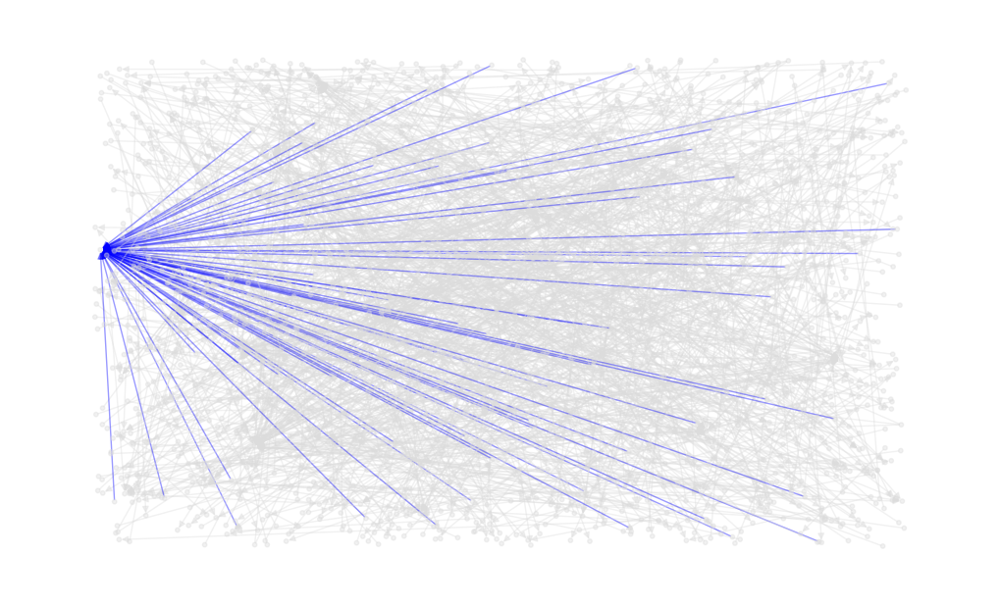

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_shooting.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_shooting.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_shooting.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_shooting.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_shooting,
        pos=nx.random_layout(g_pr_shooting),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

### Typhoon

Now let's only get the central users involved in interactions related to typhoon events.

In [ ]:
central_user_typhoon = df_central_user[df_central_user['Event_Type'] == 'typhoon']
central_user_typhoon = central_user_typhoon.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_typhoon['Total_times'] = central_user_typhoon[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_typhoon['User_ID_Targeting'] = central_user_typhoon[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_typhoon = central_user_typhoon.drop_duplicates()
central_user_typhoon = central_user_typhoon[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_typhoon = central_user_typhoon[central_user_typhoon['User_ID'] != central_user_typhoon['User_ID_Targeting']]
print(central_user_typhoon.shape)
central_user_typhoon.head()

(1406, 3)


,User_ID,User_ID_Targeting,Total_times
133,n56677,n56638,1.0
137,n56677,n56749,1.0
141,n56677,n61678,1.0
145,n56677,n98903,1.0
225,n56742,n61678,1.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_typhoon.

In [ ]:
g_central_user_typhoon = nx.from_pandas_edgelist(central_user_typhoon, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_typhoon))
g_central_user_typhoon.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_typhoon.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n58317: Degree Centrality 43.0
Node n58501: Degree Centrality 43.0
Node n88567: Degree Centrality 40.0
Node n58484: Degree Centrality 37.0
Node n66524: Degree Centrality 36.0


In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n58317'

In [ ]:
g_degree_typhoon = find_central_user(g_central_user_typhoon, central_node)
g_degree_typhoon = add_edge_att(g_central_user_typhoon, central_node)

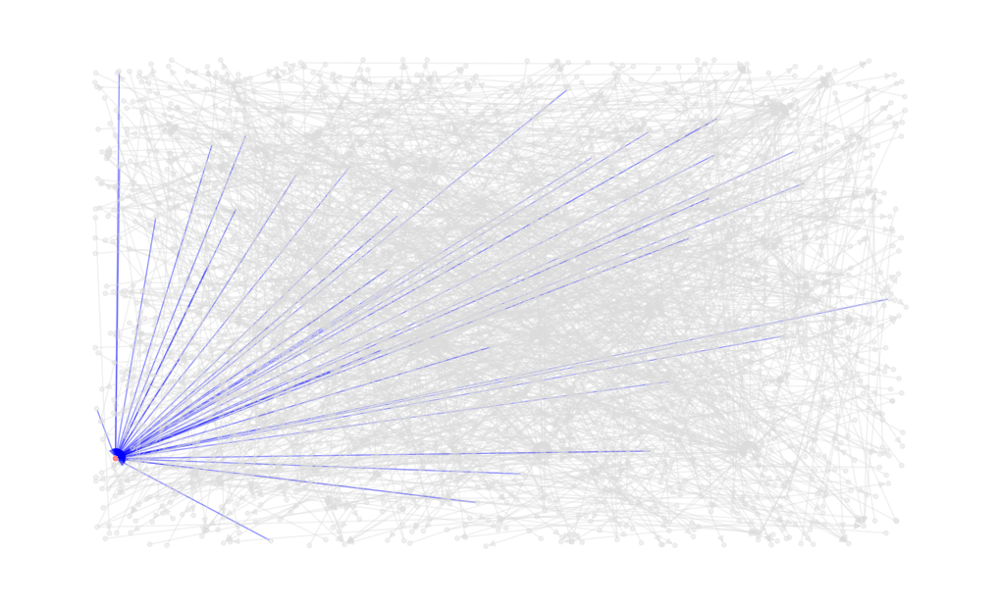

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_typhoon.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_typhoon.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_typhoon.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_typhoon.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_typhoon,
        pos=nx.random_layout(g_degree_typhoon),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_typhoon, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n83848: Betweeness Centrality 2.3821958348222057e-05
Node n58484: Betweeness Centrality 1.0689340284458614e-05
Node n65758: Betweeness Centrality 9.1622916723931e-06
Node n60729: Betweeness Centrality 8.551472227566892e-06
Node n72921: Betweeness Centrality 7.3298333379144794e-06


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n83848'

In [ ]:
g_btwn_typhoon = find_central_user(g_central_user_typhoon, central_btwn_node)
g_btwn_typhoon = add_edge_att(g_central_user_typhoon, central_btwn_node)

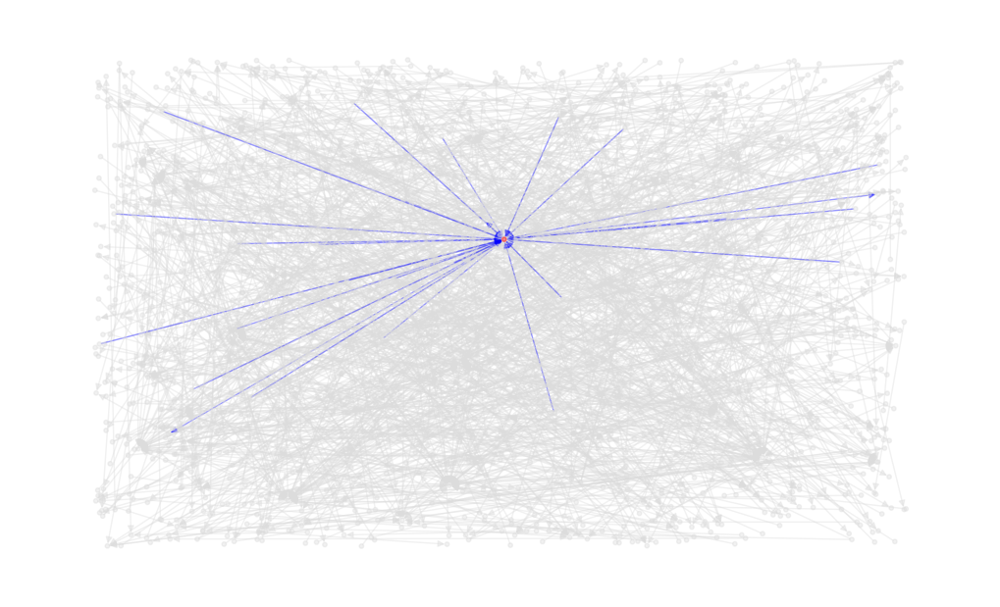

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_typhoon.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_typhoon.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_typhoon.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_typhoon.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_typhoon,
        pos=nx.random_layout(g_btwn_typhoon),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_typhoon,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n58501'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n58501: Page Rank 0.01094249430889374
Node n58317: Page Rank 0.010529542336581606
Node n58484: Page Rank 0.00934851881247423
Node n65104: Page Rank 0.008969273829310266
Node n66625: Page Rank 0.00889354645979979


In [ ]:
g_pr_typhoon = find_central_user(g_central_user_typhoon, central_pr_node)
g_pr_typhoon = add_edge_att(g_central_user_typhoon, central_pr_node)

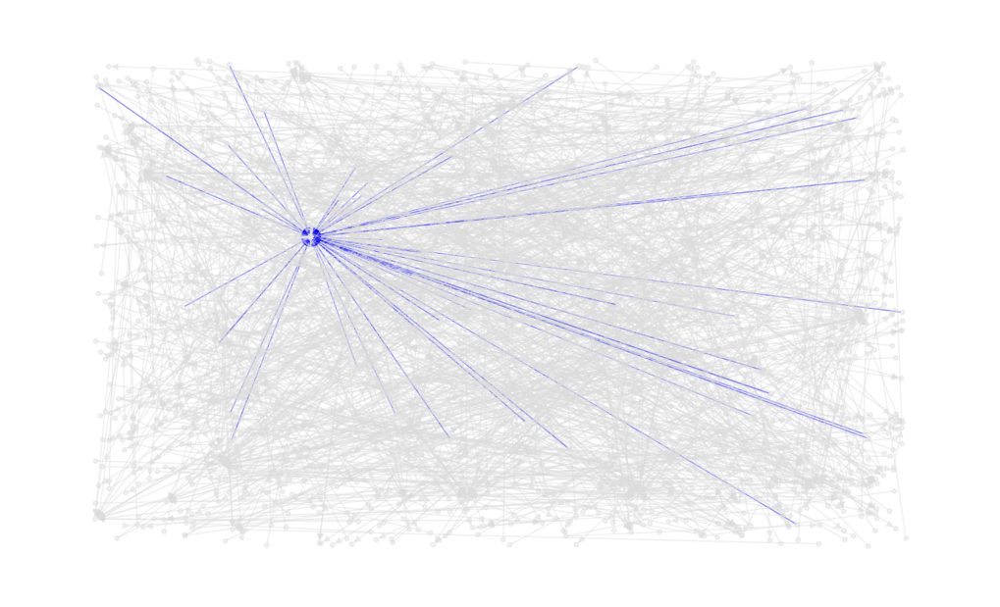

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_typhoon.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_typhoon.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_typhoon.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_typhoon.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_typhoon,
        pos=nx.random_layout(g_pr_typhoon),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

### Wildfire

Now let's only get the central users involved in interactions related to wildfires events.

In [ ]:
central_user_wildfire = df_central_user[df_central_user['Event_Type'] == 'wildfire']
central_user_wildfire = central_user_wildfire.dropna(subset=['Retweets_User_ID',
                                                             'Replied_to_User_ID',
                                                             'Mentions_User_ID'],
                                                     how='all')
central_user_wildfire['Total_times'] = central_user_wildfire[['Retweets_Times',
                                                        'Replied_to_Times',
                                                        'Mentions_Times']].sum(axis=1,
                                                                               skipna=True)

In [ ]:
central_user_wildfire['User_ID_Targeting'] = central_user_wildfire[['Retweets_User_ID',
                                                                    'Replied_to_User_ID',
                                                                    'Mentions_User_ID']].fillna(method='ffill',
                                                                                                     axis=1).iloc[:, -1]
central_user_wildfire = central_user_wildfire.drop_duplicates()
central_user_wildfire = central_user_wildfire[['User_ID', 'User_ID_Targeting', 'Total_times']]
central_user_wildfire = central_user_wildfire[central_user_wildfire['User_ID'] != central_user_wildfire['User_ID_Targeting']]
print(central_user_wildfire.shape)
central_user_wildfire.head()

(1576, 3)


,User_ID,User_ID_Targeting,Total_times
1,n56569,n97153,1.0
7,n56574,n79100,1.0
11,n56575,n97154,1.0
14,n56578,n64494,1.0
18,n56581,n97154,2.0


#### Degree Centrality

Let's calculate the degree centrality for each node in the graph g_central_user_wildfire.

In [ ]:
g_central_user_wildfire = nx.from_pandas_edgelist(central_user_wildfire, 'User_ID', 'User_ID_Targeting', 'Total_times',
                            create_using=nx.DiGraph())
isolated_nodes = list(nx.isolates(g_central_user_wildfire))
g_central_user_wildfire.remove_nodes_from(isolated_nodes)

In [ ]:
degree_centrality = dict(g_central_user_wildfire.degree(weight='Total_times'))
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: Degree Centrality {centrality:}")

Node n85174: Degree Centrality 67.0
Node n61678: Degree Centrality 64.0
Node n85147: Degree Centrality 53.0
Node n87456: Degree Centrality 50.0
Node n86625: Degree Centrality 47.0


The output indicates that node 'n85174' has the highest degree centrality score

These nodes represent users who are particularly active or influential in engaging with other users within the network, based on the total number of interactions they have initiated or received.

In [ ]:
#let's keep the first one in memory
central_node, _ = sorted_degree_centrality[0]
central_node

'n85174'

Now, let's create two functions to enable the graph to retain information about a specified user and their connections within the network in order to plot a graph that will highlight nodes and edges associated with this user.

In [ ]:
def find_central_user(g, user):
    g_central_user = {node: user if node == user else '' for node in g.nodes()}
    nx.set_node_attributes(g, g_central_user, name='central_user')
    return g

def add_edge_att(g, user):
    g_connect = {(source, target): 1 if (source == user) | (target == user) else 0 for source, target in g.edges()}
    nx.set_edge_attributes(g, g_connect, name='connect')
    return g


In [ ]:
g_degree_wildfire = find_central_user(g_central_user_wildfire, central_node)
g_degree_wildfire = add_edge_att(g_central_user_wildfire, central_node)

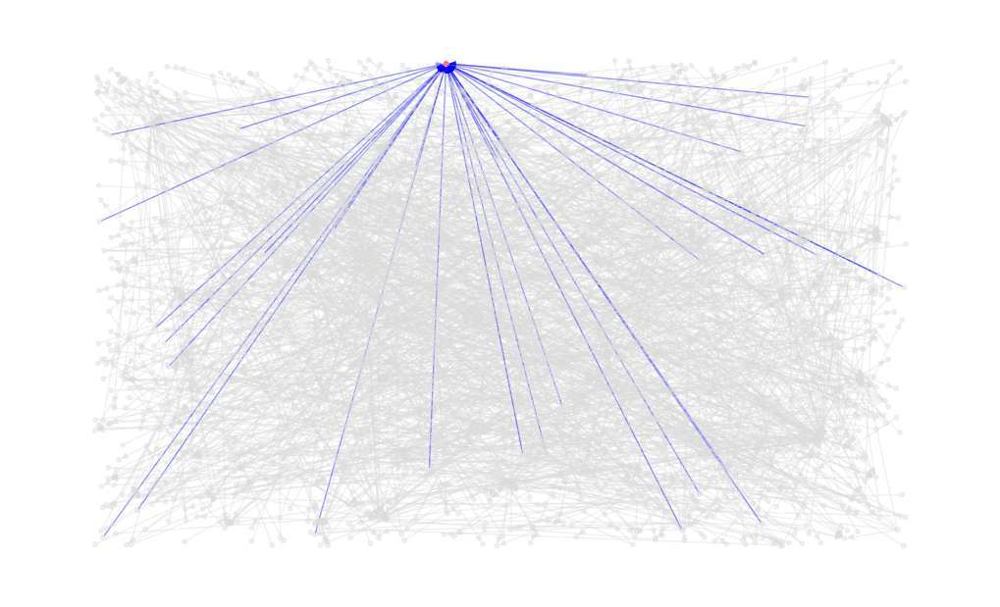

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_degree_wildfire.nodes[node]['central_user'] == central_node else 'gainsboro' for node in g_degree_wildfire.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_degree_wildfire.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_degree_wildfire.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_degree_wildfire,
        pos=nx.random_layout(g_degree_wildfire),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Betweeness Centrality

We are going to do the same for the betweeness centrality.

In [ ]:
betweeness_centrality = dict(nx.betweenness_centrality(g_central_user_wildfire, weight= 'Total_times', seed=2024))
sorted_btwn_centrality = sorted(betweeness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
#top 5 nodes
for node, centrality in sorted_btwn_centrality[:5]:
    print(f"Node {node}: Betweeness Centrality {centrality:}")

Node n67357: Betweeness Centrality 5.225648306993087e-05
Node n61678: Betweeness Centrality 2.5096863579637852e-05
Node n85230: Betweeness Centrality 1.1688950160379272e-05
Node n85208: Betweeness Centrality 9.454297923836176e-06
Node n85195: Betweeness Centrality 9.282401597948246e-06


In [ ]:
#let's save the first one
central_btwn_node, _ = sorted_btwn_centrality[0]
central_btwn_node

'n67357'

Here we see that node n67357 has the highest betweenness centrality score

We notice that the only node that appears in both the top 5 of the degree centrality and the top 5 of the betweeness centrality is Node n61678

In [ ]:
g_btwn_wildfire = find_central_user(g_central_user_wildfire, central_btwn_node)
g_btwn_wildfire = add_edge_att(g_central_user_wildfire, central_btwn_node)

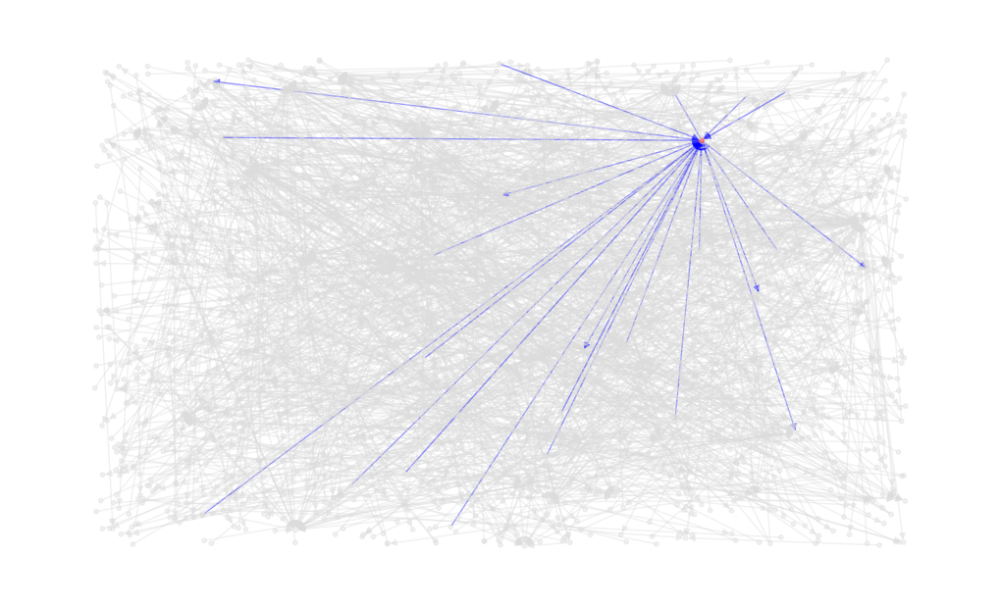

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_btwn_wildfire.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_wildfire.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_btwn_wildfire.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_wildfire.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_btwn_wildfire,
        pos=nx.random_layout(g_btwn_wildfire),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

#### Page Rank (Eigenvector centrality can behave erratically with weighted and directed graphs)

And finally, let's do the same for the page rank.

In [ ]:
pagerank = dict(nx.pagerank(g_central_user_wildfire,
                       alpha=0.85,
                       personalization=None,
                       max_iter=100,
                       tol=1e-06,
                       nstart=None,
                       weight='Total_times',
                       dangling=None))
# for node, centrality in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]:
#     print(f"Node {node}: Page Rank {centrality}")

sorted_pr = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)
central_pr_node, _ = sorted_pr[0]
central_pr_node

'n61678'

In [ ]:
#top 5 nodes
for node, centrality in sorted_pr[:5]:
    print(f"Node {node}: Page Rank {centrality:}")

Node n61678: Page Rank 0.01870231312998409
Node n63257: Page Rank 0.01631139673243402
Node n85147: Page Rank 0.014585937980068252
Node n87456: Page Rank 0.010302563397448177
Node n85174: Page Rank 0.008562529995623182


The only node that is in the top 5 of the three centrality measures is Node n61678.

In [ ]:
g_pr_wildfire = find_central_user(g_central_user_wildfire, central_pr_node)
g_pr_wildfire = add_edge_att(g_central_user_wildfire, central_pr_node)

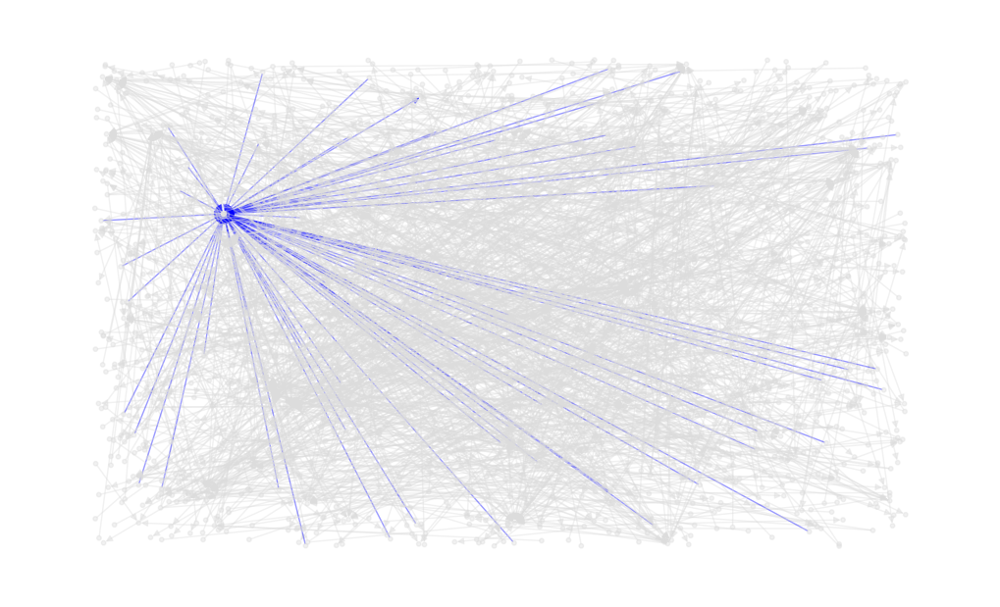

In [ ]:
# Define node colors based on the 'central_user' attribute
v_colors = ['red' if g_pr_wildfire.nodes[node]['central_user'] == central_btwn_node else 'gainsboro' for node in g_btwn_wildfire.nodes()]

# Define edge colors based on the 'connect' attribute
e_colors = ['blue' if g_pr_wildfire.edges[edge]['connect'] == 1 else 'gainsboro' for edge in g_btwn_wildfire.edges()]


# Plot the graph
plt.figure(figsize = (10, 6))
nx.draw(g_pr_wildfire,
        pos=nx.random_layout(g_pr_wildfire),
        with_labels = False,
        node_size = 10,
        node_color = v_colors,
        edge_color = e_colors,
        alpha = 0.4,
        #width = [d['Total_times']
        #for (u,v,d) in g.edges(data=True)]
       )
plt.show()

## 1.3. Distribution of the tweet posts and their main topics wrt to levels of criticality

+ Nodes = Tweets
+ Main topics = "Topic"
+ Levels of criticality: "annotation_postPriority"

In this section, we delve into the distribution of tweet posts and their corresponding main topics concerning different levels of criticality.

In [ ]:
nodes_data = list(g.nodes(data=True))

tweet_data = [(node[0],
               node[1]['created_at'],
               node[1]['annotation_postPriority'],
               node[1]['topic'],#.split('-')[-1],
               node[1]['favorite_count'],
               node[1]['text'])
              for node in nodes_data if node[1]['labels'] == ':Tweet']

columns = ['Tweet_ID', 'Created_at', 'Levels_criticality', 'topicid', 'Favorite Count', 'Text']
df_tweet = pd.DataFrame(tweet_data, columns=columns)
df_tweet = df_tweet.merge(df_event, on = 'topicid')

Let's filter out tweets with unknown criticality levels from the df_tweet and then let's calculate the count of tweets for each combination of criticality level and event type.

In [ ]:
## Distribution of tweet posts wrt to levels of criticality.
df_tweet_filtered = df_tweet[df_tweet['Levels_criticality'] != 'Unknown']
tweet_count = df_tweet_filtered.groupby(['Levels_criticality', 'Event_Type'])['Tweet_ID'].count().reset_index()
tweet_count.head()

,Levels_criticality,Event_Type,Tweet_ID
0,Critical,bombing,53
1,Critical,earthquake,49
2,Critical,flood,36
3,Critical,shooting,95
4,Critical,typhoon,104


Let's visualize it:

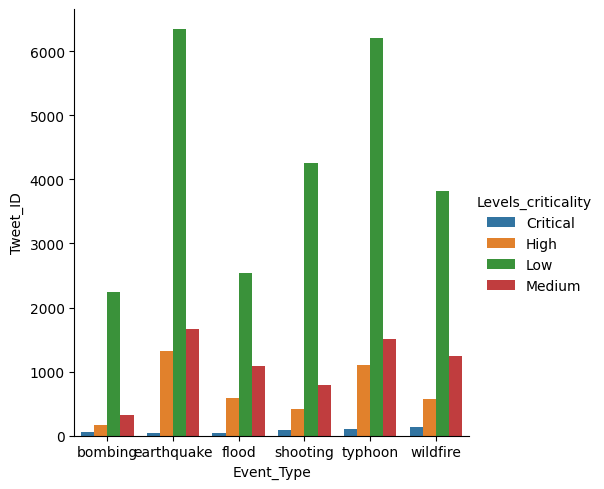

In [ ]:
sns.catplot(data=tweet_count, x = 'Event_Type', y="Tweet_ID", hue="Levels_criticality", kind="bar")

We can see that the category with the highest amount of low level of criticality is 'earthquake'. The category with the highest amount of critical level of criticality is 'wildfire'.

# 2. Analysis of User Embeddings and Similarities in Event-Based Graphs

For each event-based graph analysed previously, build the embeddings of a sample of N users based on:
- a) the graph structure;
- b) the content of their posts.

i) Indicate how do you proceed for sampling users.

ii) Compute the user-user similarities built upon the embeddings a) and b).

iii) Do the correlations (between user-user similarities build upon the graph structure embeddings and one upon content embeddings???) have similar trends across the different event types? Compare and discuss.

In [ ]:
nodes_data = list(g.nodes(data=True))

tweet_data = [(node[0],
               node[1]['created_at'],
               node[1]['annotation_postPriority'],
               node[1]['topic'],#.split('-')[-1],
               node[1]['favorite_count'],
               node[1]['text'])
              for node in nodes_data if node[1]['labels'] == ':Tweet']

columns = ['general_id', 'Created_at', 'Levels_criticality', 'topicid', 'Favorite Count', 'Tweet_text']
df_tweet = pd.DataFrame(tweet_data, columns=columns)
df_tweet = df_tweet.merge(df_event, on = 'topicid')

df_posted = pd.DataFrame(get_edges(g, 'POSTED'),
                           columns=['User_ID', 'Tweets_ID'])

df_posted = pd.merge(df_posted, df_tweet[['general_id', 'Tweet_text', 'Event_Type']], left_on = 'Tweets_ID', right_on = 'general_id')
df_posted.sample()


,User_ID,Tweets_ID,general_id,Tweet_text,Event_Type
9740,n63737,n8246,n8246,RT @triplej: Want to help out the people of QL...,flood


In [ ]:
#! pip install node2vec

In [ ]:
import networkx as nx
from node2vec import Node2Vec
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
import nltk
nltk.download('wordnet')
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline

# ALL OF THESE FUNCTIONS ARE USED TO PROCESS THE TEXT
def convert_text_to_lowercase(df, colname):
    df[colname] = df[colname].str.lower()
    return df

def not_regex(pattern):
    return r"((?!{}).)".format(pattern)

def remove_punctuation(df, colname):
    df[colname] = df[colname].str.replace('\\n', ' ')
    df[colname] = df[colname].str.replace('\\r', ' ')
    alphanumeric_characters_extended = '(\\b[-/]\\b|[a-zA-Z0-9])'
    df[colname] = df[colname].str.replace(not_regex(alphanumeric_characters_extended), ' ')
    return df

def tokenize_sentence(df, colname):
    df[colname] = df[colname].str.split()
    return df

# def remove_stop_words(df, colname):
#     stop_words = stopwords.words('english')
#     print(stop_words)
#     df[colname] = df[colname].apply(lambda x: [word for word in x if word not in stop_words])
#     return df

def lem(df, colname):
  lemmatizer = nltk.stem.WordNetLemmatizer()
  def lemmatize_text(text):
      return [lemmatizer.lemmatize(w) for w in text]
  df[colname] = df[colname].apply(lemmatize_text)
  return df

def stem(df, colname):
  df[colname] = df[colname].apply(lambda text: [stemmer.stem(w) for w in text])
  return df

def reverse_tokenize_sentence(df, colname):
    df[colname] = df[colname].map(lambda word: ' '.join(word))
    return df

def text_cleaning(df, colname):
    """
    Takes in a string of text, then performs the following:
    1. convert text to lowercase
    2. remove punctuation and new line characters '\n'
    3. Tokenize sentences
    4. Remove all stopwords
    5. lemmatization
    6. stemming
    7. convert tokenized text to text
    """
    df = (
        df
        .pipe(convert_text_to_lowercase, colname)
        .pipe(remove_punctuation, colname)
        .pipe(tokenize_sentence, colname)
        #.pipe(remove_stop_words, colname)
        .pipe(lem, colname)
        .pipe(stem, colname)
        .pipe(reverse_tokenize_sentence, colname)
    )
    return df

# USER SAMPLING (RANDOMLY)
def user_sampling(graph, percentage):

    unique_users = list(graph.nodes)
    num_users_to_sample = int(len(unique_users) * percentage)
    sampled_users = pd.Series(unique_users).sample(n=num_users_to_sample, random_state=42)
    return sampled_users

# EMBEDDINGS USING GRAPH STRUCTURE (NODE2VEC FUNCTION)
def compute_graph_embeddings(graph, sampled_users):

    node2vec = Node2Vec(graph, dimensions=64, walk_length=30, num_walks=200, workers=4,seed=42)
    model = node2vec.fit(window=10, min_count=1)

    # Extract embeddings for sampled nodes
    sampled_node_embeddings = {node: model.wv[str(node)] for node in sampled_users}
    return sampled_node_embeddings

# EMBEDDINGS USING CONTENT (TF-IDF VECTORIZATION)
def compute_content_embeddings(sampled_users, df_posted, event_type):

    df_posted = df_posted[df_posted['Event_Type'] == event_type]
    df_posted['Tweet_text'] = df_posted['Tweet_text'].astype('str')
    df_cleaned = text_cleaning(df_posted, 'Tweet_text')

    # Gather posts for sampled users: One user could poste many postes.
    user_posts = {}
    for user in sampled_users:
        user_posts[user] = " ".join(df_cleaned[df_cleaned['User_ID'] == user]['Tweet_text'])

    # TF-IDF Vectorization
    tfidf_vectorizer = TfidfVectorizer(
        analyzer='word',
        ngram_range=(1, 1),
        max_features=100,
        max_df=1.0,
        min_df=1
    )
    X_tfidf = tfidf_vectorizer.fit_transform(user_posts.values()).toarray()

    # Create a dictionary of user embeddings
    user_embeddings = {user: X_tfidf[i] for i, user in enumerate(user_posts.keys())}
    return user_embeddings

# COSINE SIMILARITY
def compute_cosine_similarity(embeddings):

    embedding_matrix = np.array(list(embeddings.values()))
    similarity_matrix = cosine_similarity(embedding_matrix)
    return similarity_matrix


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Bombing

In [ ]:
# BOMBING GRAPH WHOSE NODES ARE USERS
graph = g_central_user_bombing

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'bombing')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/1552 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(310, 310)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.14645021944413006



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: 0.017107521665676428
p-value: 1.135093405366861e-07



Based on the  very low p-value, we reject the null hypothesis and therefore conclude that  a significant correlation exists. However, its value is very low, indicating that the relationship between user-to-user similarity and user content is positive but weak.

We conclude that in general, some similar users in term of graph connectivity may post similar contents.

## Earthquake

In [ ]:
# EARTHQUAKE GRAPH WHOSE NODES ARE USERS
graph = g_central_user_earthquake

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'earthquake')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/1775 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(355, 355)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.0793369176621119



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: 0.00046132042436287896
p-value: 0.8699144648040047



The p-value is greater than the significance level (in this case, 0.05), we fail to reject the null hypothesis. Therefore, we cannot conclude that there is a statistically significant correlation between the user-to-user similarity and user content based on the given data.

## Flood

In [ ]:
# FLOOD GRAPH WHOSE NODES ARE USERS
graph = g_central_user_flood

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'flood')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/2507 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(501, 501)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.11248497100372545



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: 0.030548984711389972
p-value: 6.705456827071286e-53


Based on the very low p-value, we reject the null hypothesis and therefore conclude that a significant correlation exists. However, its value is very low, indicating that the relationship between user-to-user similarity and user content is positive but weak.

We conclude that in general, some similar users in term of graph connectivity may post similar contents.

## Shooting

In [ ]:
# SHOOTING GRAPH WHOSE NODES ARE USERS
graph = g_central_user_shooting

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'shooting')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/1945 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(389, 389)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.09246617879753341



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: -0.013394799624889988
p-value: 1.8806075246048703e-07



Based on the  very low p-value, we reject the null hypothesis and therefore conclude that  a significant correlation exists. However, its value is very low, indicating that the relationship between user-to-user similarity and user content is negative but weak.

## Typhoon

In [ ]:
# TYPHOON GRAPH WHOSE NODES ARE USERS
graph = g_central_user_typhoon

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'typhoon')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/1811 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(362, 362)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.09166265576982567



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: 0.009407610470812289
p-value: 0.0006601934788932388



Based on the  very low p-value, we reject the null hypothesis and therefore conclude that  a significant correlation exists. However, its value is very low, indicating that the relationship between user-to-user similarity and user content is positive but weak.

We conclude that in general, some similar users in term of graph connectivity may post similar contents.

## Wildfire

In [ ]:
# WILDFIRE GRAPH WHOSE NODES ARE USERS
graph = g_central_user_wildfire

# SAMPLING USER WITH 20% POPULATION
sampled_users = user_sampling(graph, 0.2)

# GRAPH STRUCTURE EMBEDDINGS
sampled_node_embeddings = compute_graph_embeddings(graph, sampled_users)

# EMBEDDINGS OF TWEETS POSTED BY USERS IN SAMPLE (ONE USER COULD POST MANY POSTS AND TALKS ABOUT DIFFERENT EVENTS)
sampled_text_embeddings = compute_content_embeddings(sampled_users, df_posted, 'wildfire')

# COMPUTE USER-USER SIMILARITIES BASED ON GRAPH STRUCTURE
graph_similarity = compute_cosine_similarity(sampled_node_embeddings)

# COMPUTE USER-USER SIMILARITIES BASED ON POST'S CONTENT
content_similarity = compute_cosine_similarity(sampled_text_embeddings)

Computing transition probabilities:   0%|          | 0/1707 [00:00<?, ?it/s]

In [ ]:
# CHECK: WE HAVE 341 SAMPLED USERS AND WE HAVE 341 SIMILARTIES SCORE FOR EACH USER
# SO 341x341 SIMILARITY MATRIX!
content_similarity.shape

(341, 341)

Let us evaluate the correlation between these two similarities

### Using pearson's correlation coefficent

In [ ]:
print( "Correlation coefficient: ",np.corrcoef(content_similarity.flatten(),graph_similarity.flatten())[0,1])

Correlation coefficient:  0.12990806003375846



There is a positive correlation between content similarity and graph similarity, indicating a weak positive linear relationship between these two factors.
 The correlation is not very strong, suggesting that user-based similarities in graph structure embeddings and content embeddings are somewhat related but not strongly correlated.


### Using Spearman's rank correlation

---



We will also calculate the Spearsman's correlation between the two similarity matrix while testing whether the correlation is statistically significant.

In [ ]:
spearman_corr, spearman_p_value = spearmanr(graph_similarity.flatten(), content_similarity.flatten())
print("Correlation coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Correlation coefficient: 0.026247932508486643
p-value: 3.4912756849372265e-19



Based on the  very low p-value, we reject the null hypothesis and therefore conclude that  a significant correlation exists. However, its value is very low, indicating that the relationship between user-to-user similarity and user content is positive but weak.

We conclude that in general, some similar users in term of graph connectivity may post similar contents.